# **Project Name:** Cluster Analysis (Group 5)

In [ ]:
!pip install Kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Importing required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import scipy.cluster.hierarchy as sch
import statsmodels.formula.api as smf
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from kneed import KneeLocator
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# **Business Problem**
### Creating clusters on Global Development Measurement dataset.
### **Data Set Details:**
###The dataset has information about important economic and development metrics related to various countries across the globe.
### **Variable Description:**
### Birth Rate, Business tax, CO2emissions, Country, Days to start business, Ease of business, energy usage, GDP, healthexp%GDP, healthexp/capita, hours to do tax, infant mortality, internet usage, lending rate, life expectancy female, etc.
### **Acceptance Criterion:**
### Work on different clustering models, do a comparative analysis and need to deploy the clustering application on streamlit, flask etc.


In [ ]:
wdm_data = pd.read_excel("/content/World_development_mesurement.xlsx")
wdm_data

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"


# **Exploratory Data Analysis**

In [ ]:
wdm_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [ ]:
wdm_data.shape

(2704, 25)

In [ ]:
wdm_data.columns

Index(['Birth Rate', 'Business Tax Rate', 'CO2 Emissions', 'Country',
       'Days to Start Business', 'Ease of Business', 'Energy Usage', 'GDP',
       'Health Exp % GDP', 'Health Exp/Capita', 'Hours to do Tax',
       'Infant Mortality Rate', 'Internet Usage', 'Lending Interest',
       'Life Expectancy Female', 'Life Expectancy Male', 'Mobile Phone Usage',
       'Number of Records', 'Population 0-14', 'Population 15-64',
       'Population 65+', 'Population Total', 'Population Urban',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [ ]:
wdm_data.isnull().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          309
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Number of Records            0
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

In [ ]:
wdm_data.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [ ]:
wdm_data[wdm_data.duplicated()].shape

(0, 25)

In [ ]:
wdm_data['Business Tax Rate'] = wdm_data['Business Tax Rate'].str.rstrip('%').astype(float)

wdm_data['GDP'] = wdm_data['GDP'].str.replace('$','').str.replace(',','')
wdm_data['GDP'] = pd.to_numeric(wdm_data['GDP'],errors='coerce')
wdm_data['GDP'] = wdm_data['GDP'].fillna(0).astype(int)

wdm_data['Health Exp/Capita'] = wdm_data['Health Exp/Capita'].str.rstrip('$').str.replace('$','').str.replace(',','')
wdm_data['Health Exp/Capita'] = wdm_data['Health Exp/Capita'].astype(float)

wdm_data['Tourism Inbound'] = wdm_data['Tourism Inbound'].str.rstrip('$').str.replace('$','').str.replace(',','')
wdm_data['Tourism Inbound'] = wdm_data['Tourism Inbound'].astype(float)

wdm_data['Tourism Outbound'] = wdm_data['Tourism Outbound'].str.rstrip('$').str.replace('$','').str.replace(',','')
wdm_data['Tourism Outbound'] = wdm_data['Tourism Outbound'].astype(float)

In [ ]:
wdm_data

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,54790058957,0.035,60.0,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,9129594819,0.034,22.0,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,2359122303,0.043,15.0,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,5788311645,0.047,152.0,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,2610959139,0.051,12.0,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,0,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4,NaN,United States,5.0,4.0,2132446.0,16244600000000,0.179,8895.0,...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015,41.9,NaN,Uruguay,7.0,85.0,NaN,50004354667,0.089,1308.0,...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020,61.9,NaN,"Venezuela, RB",144.0,180.0,NaN,381286223859,0.046,593.0,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09


In [ ]:
wdm_data.Country.nunique()

208

In [ ]:
wdm_data.dtypes

Birth Rate                float64
Business Tax Rate         float64
CO2 Emissions             float64
Country                    object
Days to Start Business    float64
Ease of Business          float64
Energy Usage              float64
GDP                         int64
Health Exp % GDP          float64
Health Exp/Capita         float64
Hours to do Tax           float64
Infant Mortality Rate     float64
Internet Usage            float64
Lending Interest          float64
Life Expectancy Female    float64
Life Expectancy Male      float64
Mobile Phone Usage        float64
Number of Records           int64
Population 0-14           float64
Population 15-64          float64
Population 65+            float64
Population Total            int64
Population Urban          float64
Tourism Inbound           float64
Tourism Outbound          float64
dtype: object

# **Feature Engineering**

In [ ]:
wdm_data.rename(columns = {'Birth Rate': 'Birth_Rate',
                           'Business Tax Rate': 'Business_Tax_Rate',
                           'CO2 Emissions': 'CO2_Emissions',
                           'Days to Start Business': 'Days_to_Start_Business',
                           'Ease of Business': 'Ease_of_Business',
                           'Energy Usage': 'Energy_Usage',
                           'Health Exp % GDP': 'Health_Exp%_GDP',
                           'Health Exp/Capita': 'Health_Exp/Capita',
                           'Hours to do Tax': 'Hours_to_do_Tax',
                           'Infant Mortality Rate': 'Infant_Mortality_Rate',
                           'Internet Usage': 'Internet_Usage',
                           'Lending Interest': 'Lending_Interest',
                           'Life Expectancy Female': 'Life_Expectancy_Female',
                           'Life Expectancy Male': 'Life_Expectancy_Male',
                           'Mobile Phone Usage': 'Mobile_Phone_Usage',
                           'Number of Records': 'Number_of_Records',
                           'Population 0-14': 'Population_0-14',
                           'Population 15-64': 'Population_15-64',
                           'Population 65+': 'Population_65+',
                           'Population Total': 'Population_Total',
                           'Population Urban': 'Population_Urban',
                           'Tourism Inbound': 'Tourism_Inbound',
                           'Tourism Outbound': 'Tourism_Outbound'}, inplace=True)

In [ ]:
wdm_data.head()

In [ ]:
data2 = wdm_data.drop(columns = ["Ease_of_Business","Number_of_Records"], axis=1)

In [ ]:
data2.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,...,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.020,NaN,87931.0,Algeria,NaN,26998.0,54790058957,0.035,60.0,NaN,...,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,NaN,9542.0,Angola,NaN,7499.0,9129594819,0.034,22.0,NaN,...,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,NaN,1617.0,Benin,NaN,1983.0,2359122303,0.043,15.0,NaN,...,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,NaN,4276.0,Botswana,NaN,1836.0,5788311645,0.047,152.0,NaN,...,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,2610959139,0.051,12.0,NaN,...,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


In [ ]:
data2.isnull().sum()

Birth_Rate                 119
Business_Tax_Rate         1281
CO2_Emissions              579
Country                      0
Days_to_Start_Business     986
Energy_Usage               919
GDP                          0
Health_Exp%_GDP            309
Health_Exp/Capita          309
Hours_to_do_Tax           1288
Infant_Mortality_Rate      260
Internet_Usage             173
Lending_Interest           824
Life_Expectancy_Female     136
Life_Expectancy_Male       136
Mobile_Phone_Usage         167
Population_0-14            220
Population_15-64           220
Population_65+             220
Population_Total             0
Population_Urban            26
Tourism_Inbound            368
Tourism_Outbound           471
dtype: int64

In [ ]:
data2.dtypes

Birth_Rate                float64
Business_Tax_Rate         float64
CO2_Emissions             float64
Country                    object
Days_to_Start_Business    float64
Energy_Usage              float64
GDP                         int64
Health_Exp%_GDP           float64
Health_Exp/Capita         float64
Hours_to_do_Tax           float64
Infant_Mortality_Rate     float64
Internet_Usage            float64
Lending_Interest          float64
Life_Expectancy_Female    float64
Life_Expectancy_Male      float64
Mobile_Phone_Usage        float64
Population_0-14           float64
Population_15-64          float64
Population_65+            float64
Population_Total            int64
Population_Urban          float64
Tourism_Inbound           float64
Tourism_Outbound          float64
dtype: object

In [ ]:
skew = data2.skew().sort_values(ascending=False)
kurtosis = data2.kurt().sort_values(ascending=False)

In [ ]:
print("Skewness:\n",skew, "\n\n", "Kurtosis:\n",kurtosis)

Skewness:
 Lending_Interest          15.536119
GDP                        9.805980
Population_Total           8.788164
CO2_Emissions              8.654039
Days_to_Start_Business     7.437592
Tourism_Inbound            7.114871
Energy_Usage               7.062230
Tourism_Outbound           5.210304
Hours_to_do_Tax            4.491308
Business_Tax_Rate          4.342568
Health_Exp/Capita          2.817482
Health_Exp%_GDP            1.179757
Infant_Mortality_Rate      1.049118
Internet_Usage             0.940966
Population_65+             0.919841
Birth_Rate                 0.662151
Mobile_Phone_Usage         0.569605
Population_0-14            0.059660
Population_Urban           0.012519
Population_15-64          -0.186881
Life_Expectancy_Male      -0.705485
Life_Expectancy_Female    -0.891556
dtype: float64 

 Kurtosis:
 Lending_Interest          374.122539
GDP                       114.401439
CO2_Emissions              83.080721
Population_Total           82.383028
Days_to_Start_Busine

In [ ]:
data2.describe().T

,count,mean,std,min,25%,50%,75%,max
Birth_Rate,2585.0,2.271489e-02,1.133843e-02,0.007,1.300000e-02,2.000000e-02,3.100000e-02,5.300000e-02
Business_Tax_Rate,1423.0,4.896690e+01,4.095412e+01,8.200,3.240000e+01,4.100000e+01,5.155000e+01,3.391000e+02
CO2_Emissions,2125.0,1.423071e+05,6.159288e+05,7.000,1.360000e+03,8.529000e+03,5.910800e+04,8.286892e+06
Days_to_Start_Business,1718.0,3.999942e+01,5.731859e+01,1.000,1.300000e+01,2.600000e+01,4.500000e+01,6.940000e+02
Energy_Usage,1785.0,7.723684e+04,2.599239e+05,8.000,3.737000e+03,1.433800e+04,4.185200e+04,2.727728e+06
GDP,2704.0,2.433624e+11,1.087427e+12,0.000,2.025005e+09,1.201895e+10,9.101825e+10,1.624460e+13
Health_Exp%_GDP,2395.0,6.416952e-02,2.632460e-02,0.008,4.600000e-02,6.100000e-02,7.900000e-02,2.250000e-01
Health_Exp/Capita,2395.0,8.013971e+02,1.473448e+03,2.000,5.000000e+01,1.930000e+02,6.650000e+02,9.908000e+03
Hours_to_do_Tax,1416.0,3.020685e+02,2.732997e+02,12.000,1.560000e+02,2.390000e+02,3.447500e+02,2.600000e+03
Infant_Mortality_Rate,2444.0,3.281301e-02,2.996760e-02,0.002,9.000000e-03,2.000000e-02,5.300000e-02,1.410000e-01


In [ ]:
data2.corr()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
Birth_Rate,1.000000,0.288982,-0.175750,0.169013,-0.169664,-0.187456,-0.227653,-0.463907,0.069324,0.872535,...,-0.868174,-0.825745,-0.558411,0.955966,-0.912837,-0.773014,-0.057851,-0.606933,-0.287021,-0.296049
Business_Tax_Rate,0.288982,1.000000,0.022298,0.013339,0.059210,0.006099,0.034727,-0.110941,0.138647,0.341270,...,-0.284273,-0.312970,-0.233985,0.218907,-0.258508,-0.106498,0.058711,-0.123177,-0.017257,-0.021214
CO2_Emissions,-0.175750,0.022298,1.000000,-0.055666,0.988715,0.802213,0.163236,0.254039,0.081485,-0.135421,...,0.135219,0.141452,0.054400,-0.198328,0.190808,0.160403,0.721145,0.098051,0.696357,0.650080
Days_to_Start_Business,0.169013,0.013339,-0.055666,1.000000,-0.069418,-0.078984,-0.147686,-0.181849,0.148423,0.200082,...,-0.197764,-0.213764,-0.199868,0.203978,-0.166224,-0.201973,0.001357,-0.092493,-0.122206,-0.117471
Energy_Usage,-0.169664,0.059210,0.988715,-0.069418,1.000000,0.861177,0.253146,0.278551,0.074673,-0.120019,...,0.125224,0.132984,0.045198,-0.184007,0.171528,0.148971,0.677971,0.094218,0.742379,0.703488
GDP,-0.187456,0.006099,0.802213,-0.078984,0.861177,1.000000,0.328686,0.446516,0.030507,-0.178118,...,0.188379,0.199254,0.126041,-0.229219,0.156374,0.273128,0.381448,0.164331,0.880064,0.857197
Health_Exp%_GDP,-0.227653,0.034727,0.163236,-0.147686,0.253146,0.328686,1.000000,0.444986,-0.079755,-0.165117,...,0.208335,0.219441,0.187336,-0.292266,0.093604,0.489835,-0.054097,0.205994,0.379051,0.371141
Health_Exp/Capita,-0.463907,-0.110941,0.254039,-0.181849,0.278551,0.446516,0.444986,1.000000,-0.213454,-0.452413,...,0.499595,0.540419,0.460803,-0.529232,0.362444,0.623775,-0.005934,0.520300,0.556093,0.579977
Hours_to_do_Tax,0.069324,0.138647,0.081485,0.148423,0.074673,0.030507,-0.079755,-0.213454,1.000000,0.133808,...,-0.104772,-0.154317,-0.103461,0.075677,-0.084376,-0.043624,0.146920,0.010022,-0.058792,-0.040801
Infant_Mortality_Rate,0.872535,0.341270,-0.135421,0.200082,-0.120019,-0.178118,-0.165117,-0.452413,0.133808,1.000000,...,-0.933001,-0.912240,-0.599383,0.822479,-0.798960,-0.649284,0.006897,-0.619742,-0.262693,-0.267785


# **Mean Imputation**

In [ ]:
for i in data2.columns:
    null_df = data2[data2[i].isnull()]
    print(i, " is having missing values from ", null_df['Country'].nunique(), " countries.\n")

Birth_Rate  is having missing values from  13  countries.

Business_Tax_Rate  is having missing values from  208  countries.

CO2_Emissions  is having missing values from  208  countries.

Country  is having missing values from  0  countries.

Days_to_Start_Business  is having missing values from  208  countries.

Energy_Usage  is having missing values from  174  countries.

GDP  is having missing values from  0  countries.

Health_Exp%_GDP  is having missing values from  25  countries.

Health_Exp/Capita  is having missing values from  25  countries.

Hours_to_do_Tax  is having missing values from  208  countries.

Infant_Mortality_Rate  is having missing values from  20  countries.

Internet_Usage  is having missing values from  32  countries.

Lending_Interest  is having missing values from  90  countries.

Life_Expectancy_Female  is having missing values from  14  countries.

Life_Expectancy_Male  is having missing values from  14  countries.

Mobile_Phone_Usage  is having missing 

In [ ]:
data_fillna = data2.copy()

In [ ]:
mean_fill_cols = data_fillna.drop(columns=['Country','Population_Total']).columns

In [ ]:
final_df_after_mean_imputation = pd.DataFrame()
for col in mean_fill_cols:
    fill_na_df = data_fillna[['Country', col]]
    fill_na_df[col] = fill_na_df.groupby("Country")[col].transform(lambda x: x.fillna(x.mean()))
    final_df_after_mean_imputation = pd.concat([final_df_after_mean_imputation, fill_na_df], axis=1)

In [ ]:
final_df_after_mean_imputation.shape

(2704, 42)

In [ ]:
final_df_after_mean_imputation = final_df_after_mean_imputation.drop(columns=['Country'])

In [ ]:
final_df_after_mean_imputation['Country'] = data_fillna['Country']
final_df_after_mean_imputation['Population_Total'] = data_fillna['Population_Total']

In [ ]:
final_df_after_mean_imputation.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country,Population_Total
0,0.020,73.7125,87931.0,25.0,26998.0,54790058957,0.035,60.0,451.00,0.034,...,67.0,0.0,0.342,0.619,0.039,0.599,102000000.0,193000000.0,Algeria,31719449
1,0.050,52.1000,9542.0,92.9,7499.0,9129594819,0.034,22.0,275.75,0.128,...,44.0,0.0,0.476,0.499,0.025,0.324,34000000.0,146000000.0,Angola,13924930
2,0.043,71.0875,1617.0,30.4,1983.0,2359122303,0.043,15.0,270.00,0.090,...,53.0,0.0,0.454,0.517,0.029,0.383,77000000.0,50000000.0,Benin,6949366
3,0.027,18.7250,4276.0,85.2,1836.0,5788311645,0.047,152.0,144.50,0.054,...,49.0,0.1,0.383,0.587,0.029,0.532,227000000.0,209000000.0,Botswana,1755375
4,0.046,45.4875,1041.0,24.2,NaN,2610959139,0.051,12.0,270.00,0.096,...,49.0,0.0,0.468,0.505,0.028,0.178,23000000.0,30000000.0,Burkina Faso,11607944


In [ ]:
# Example of Country which is having null values for the entire feature
example_df = final_df_after_mean_imputation[['Country', 'Energy_Usage']]
example_df[example_df['Country'] == 'Afghanistan']

,Country,Energy_Usage
53,Afghanistan,NaN
261,Afghanistan,NaN
469,Afghanistan,NaN
677,Afghanistan,NaN
885,Afghanistan,NaN
1093,Afghanistan,NaN
1301,Afghanistan,NaN
1509,Afghanistan,NaN
1717,Afghanistan,NaN
1925,Afghanistan,NaN


In [ ]:
percent_missing =  final_df_after_mean_imputation.isnull().sum() * 100 / len(data2)
percent_missing.sort_values(ascending=False)

Lending_Interest          21.634615
Energy_Usage              19.711538
Hours_to_do_Tax           11.057692
Business_Tax_Rate         11.057692
Days_to_Start_Business    11.057692
Health_Exp%_GDP           11.057692
Health_Exp/Capita         11.057692
Tourism_Outbound          10.576923
Infant_Mortality_Rate      9.615385
Tourism_Inbound            7.692308
Population_0-14            7.692308
Population_15-64           7.692308
Population_65+             7.692308
CO2_Emissions              6.250000
Internet_Usage             4.326923
Life_Expectancy_Female     2.403846
Life_Expectancy_Male       2.403846
Mobile_Phone_Usage         2.403846
Birth_Rate                 0.961538
Population_Urban           0.961538
GDP                        0.000000
Country                    0.000000
Population_Total           0.000000
dtype: float64

In [ ]:
final_df_after_mean_imputation.describe().T

,count,mean,std,min,25%,50%,75%,max
Birth_Rate,2678.0,2.250511e-02,1.126928e-02,0.007,1.300000e-02,2.000000e-02,3.000000e-02,5.300000e-02
Business_Tax_Rate,2405.0,4.840321e+01,3.951812e+01,8.200,3.238750e+01,4.095000e+01,5.140000e+01,3.391000e+02
CO2_Emissions,2535.0,1.411257e+05,6.113068e+05,7.000,1.358500e+03,8.196000e+03,5.852550e+04,8.286892e+06
Days_to_Start_Business,2405.0,4.065743e+01,5.935394e+01,1.000,1.500000e+01,2.700000e+01,4.500000e+01,6.940000e+02
Energy_Usage,2171.0,6.614570e+04,2.410321e+05,8.000,2.262500e+03,9.308000e+03,3.255450e+04,2.727728e+06
GDP,2704.0,2.433624e+11,1.087427e+12,0.000,2.025005e+09,1.201895e+10,9.101825e+10,1.624460e+13
Health_Exp%_GDP,2405.0,6.405098e-02,2.639619e-02,0.008,4.500000e-02,6.100000e-02,7.900000e-02,2.250000e-01
Health_Exp/Capita,2405.0,7.981935e+02,1.471216e+03,2.000,5.000000e+01,1.910000e+02,6.640000e+02,9.908000e+03
Hours_to_do_Tax,2405.0,2.993542e+02,2.685835e+02,12.000,1.550000e+02,2.372500e+02,3.440000e+02,2.600000e+03
Infant_Mortality_Rate,2444.0,3.281301e-02,2.996760e-02,0.002,9.000000e-03,2.000000e-02,5.300000e-02,1.410000e-01


In [ ]:
median_data = final_df_after_mean_imputation.drop(columns = ["Country"],axis=1)
median_data.fillna(median_data.median(), inplace=True)

In [ ]:
median_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Birth_Rate,2704.0,2.248102e-02,1.121762e-02,0.007,1.300000e-02,2.000000e-02,3.000000e-02,5.300000e-02
Business_Tax_Rate,2704.0,4.757906e+01,3.734163e+01,8.200,3.346250e+01,4.095000e+01,4.910000e+01,3.391000e+02
CO2_Emissions,2704.0,1.328176e+05,5.927623e+05,7.000,1.566000e+03,8.196000e+03,5.422825e+04,8.286892e+06
Days_to_Start_Business,2704.0,3.914724e+01,5.613864e+01,1.000,1.630000e+01,2.700000e+01,4.110000e+01,6.940000e+02
Energy_Usage,2704.0,5.494211e+04,2.171450e+05,8.000,3.019500e+03,9.308000e+03,2.524700e+04,2.727728e+06
GDP,2704.0,2.433624e+11,1.087427e+12,0.000,2.025005e+09,1.201895e+10,9.101825e+10,1.624460e+13
Health_Exp%_GDP,2704.0,6.371362e-02,2.491185e-02,0.008,4.775000e-02,6.100000e-02,7.600000e-02,2.250000e-01
Health_Exp/Capita,2704.0,7.310519e+02,1.400472e+03,2.000,5.700000e+01,1.910000e+02,5.512500e+02,9.908000e+03
Hours_to_do_Tax,2704.0,2.924869e+02,2.540412e+02,12.000,1.640000e+02,2.372500e+02,3.358750e+02,2.600000e+03
Infant_Mortality_Rate,2704.0,3.158099e-02,2.873929e-02,0.002,1.000000e-02,2.000000e-02,4.900000e-02,1.410000e-01


In [ ]:
median_data['Country'] = final_df_after_mean_imputation['Country']
median_data.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Urban,Tourism_Inbound,Tourism_Outbound,Population_Total,Country
0,0.020,73.7125,87931.0,25.0,26998.0,54790058957,0.035,60.0,451.00,0.034,...,67.0,0.0,0.342,0.619,0.039,0.599,102000000.0,193000000.0,31719449,Algeria
1,0.050,52.1000,9542.0,92.9,7499.0,9129594819,0.034,22.0,275.75,0.128,...,44.0,0.0,0.476,0.499,0.025,0.324,34000000.0,146000000.0,13924930,Angola
2,0.043,71.0875,1617.0,30.4,1983.0,2359122303,0.043,15.0,270.00,0.090,...,53.0,0.0,0.454,0.517,0.029,0.383,77000000.0,50000000.0,6949366,Benin
3,0.027,18.7250,4276.0,85.2,1836.0,5788311645,0.047,152.0,144.50,0.054,...,49.0,0.1,0.383,0.587,0.029,0.532,227000000.0,209000000.0,1755375,Botswana
4,0.046,45.4875,1041.0,24.2,9308.0,2610959139,0.051,12.0,270.00,0.096,...,49.0,0.0,0.468,0.505,0.028,0.178,23000000.0,30000000.0,11607944,Burkina Faso


In [ ]:
median_data.isnull().sum()

Birth_Rate                0
Business_Tax_Rate         0
CO2_Emissions             0
Days_to_Start_Business    0
Energy_Usage              0
GDP                       0
Health_Exp%_GDP           0
Health_Exp/Capita         0
Hours_to_do_Tax           0
Infant_Mortality_Rate     0
Internet_Usage            0
Lending_Interest          0
Life_Expectancy_Female    0
Life_Expectancy_Male      0
Mobile_Phone_Usage        0
Population_0-14           0
Population_15-64          0
Population_65+            0
Population_Urban          0
Tourism_Inbound           0
Tourism_Outbound          0
Population_Total          0
Country                   0
dtype: int64

# **Data Visualization**

In [ ]:
cols = data2.columns

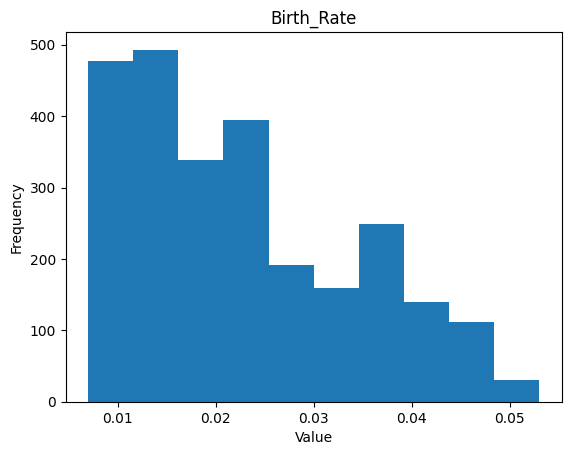

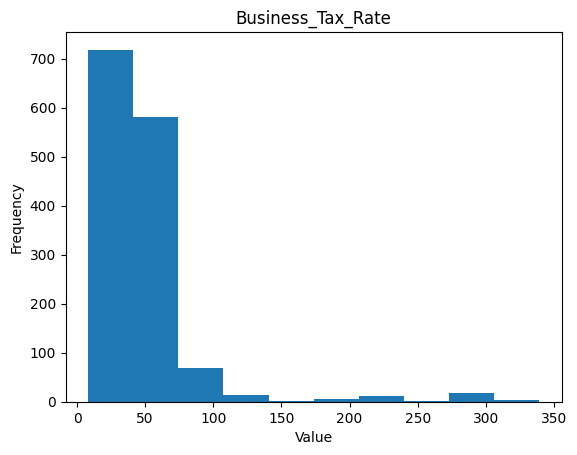

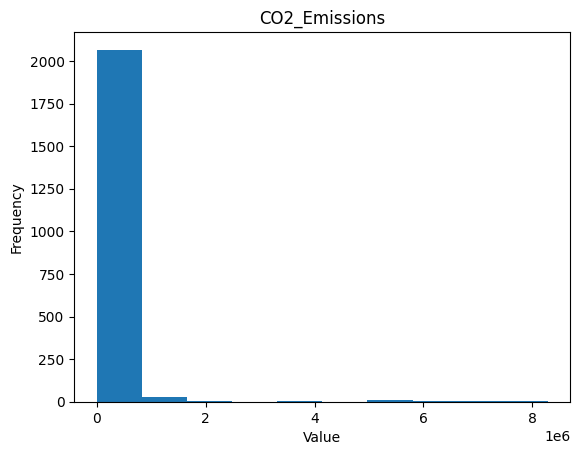

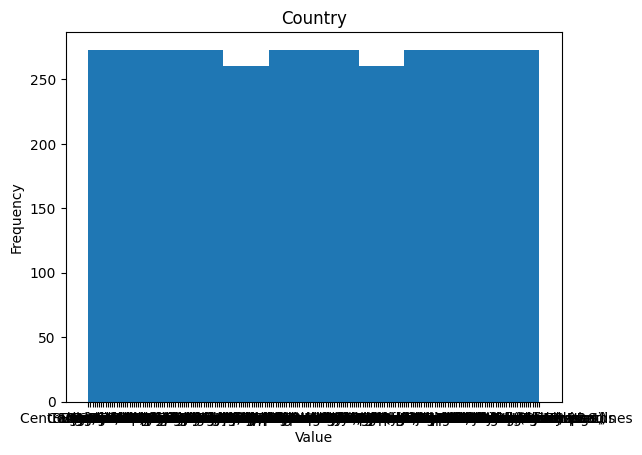

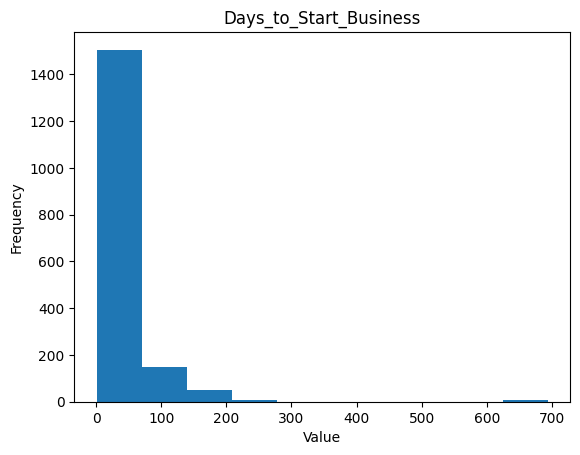

...

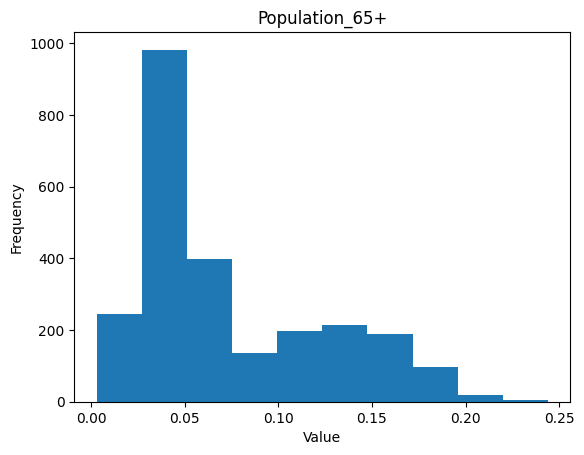

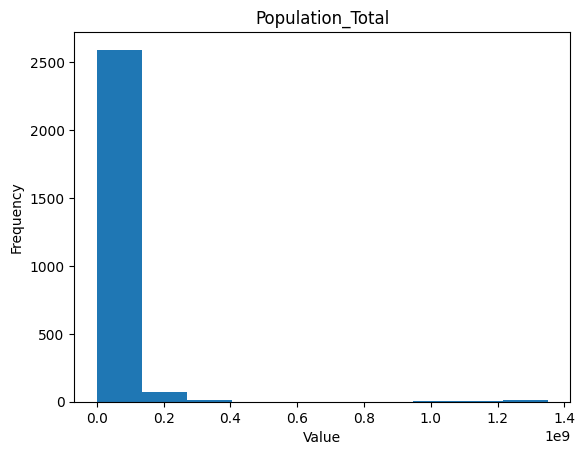

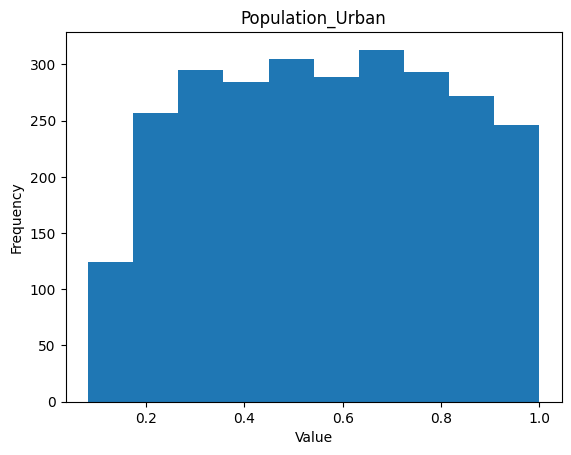

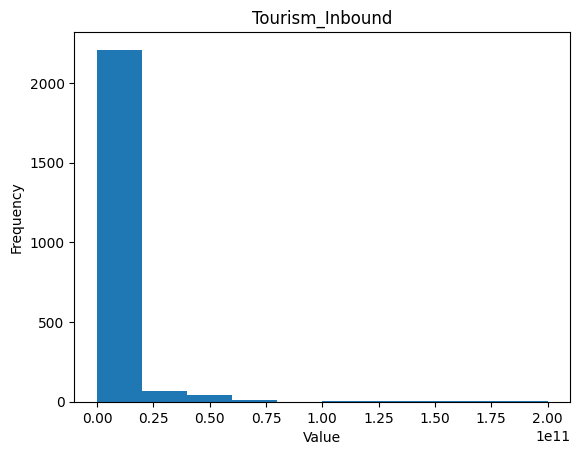

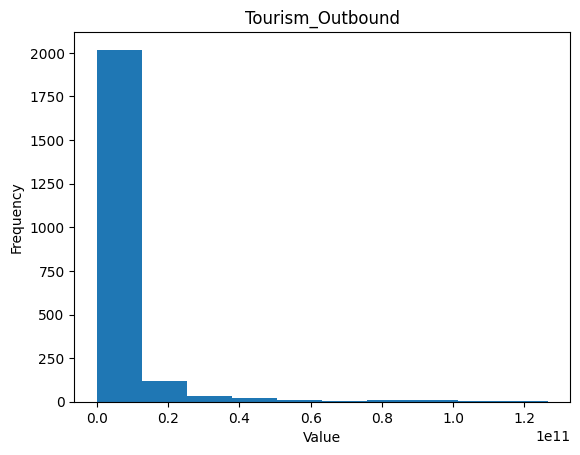

In [ ]:
# Bar Charts
for column in cols:
  plt.hist(data2[column])
  plt.title(column)
  plt.xlabel('Value')
  plt.ylabel('Frequency')
  plt.show()

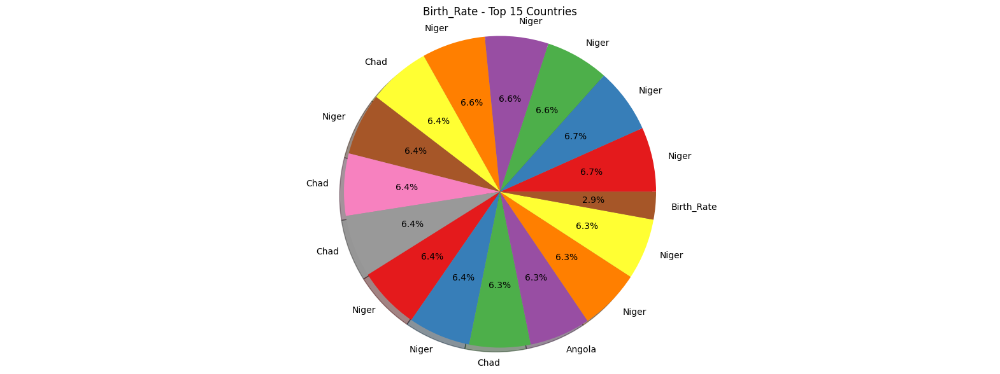

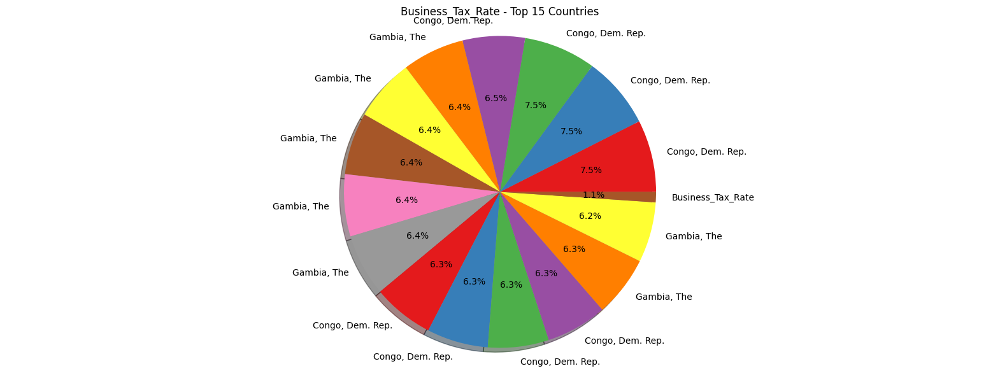

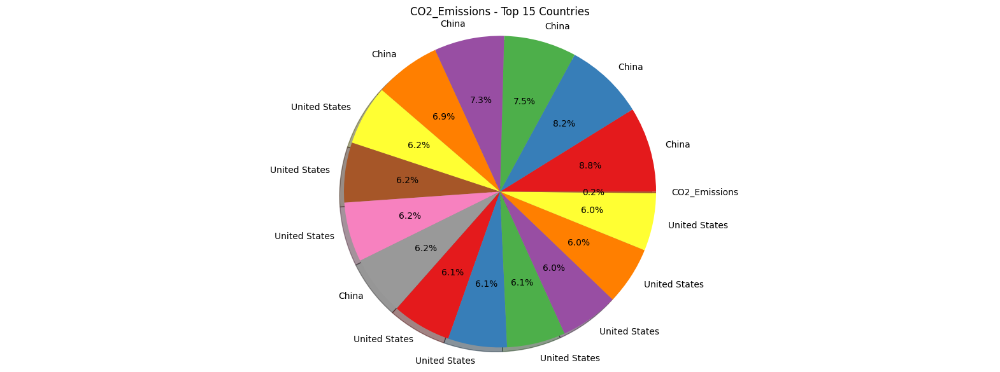

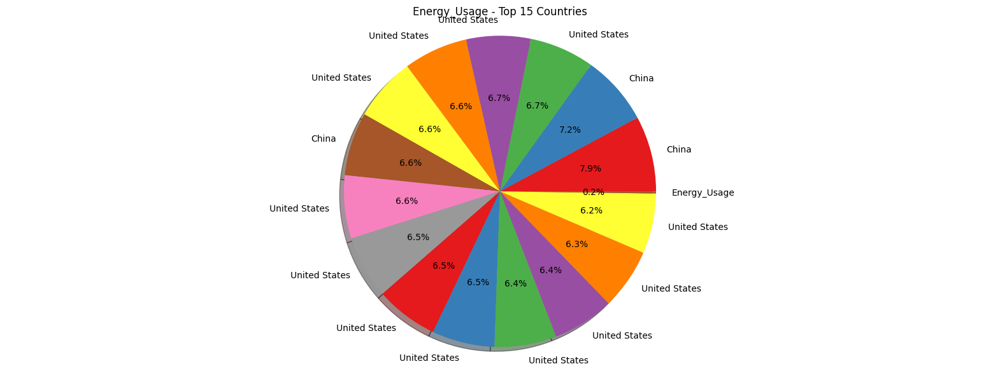

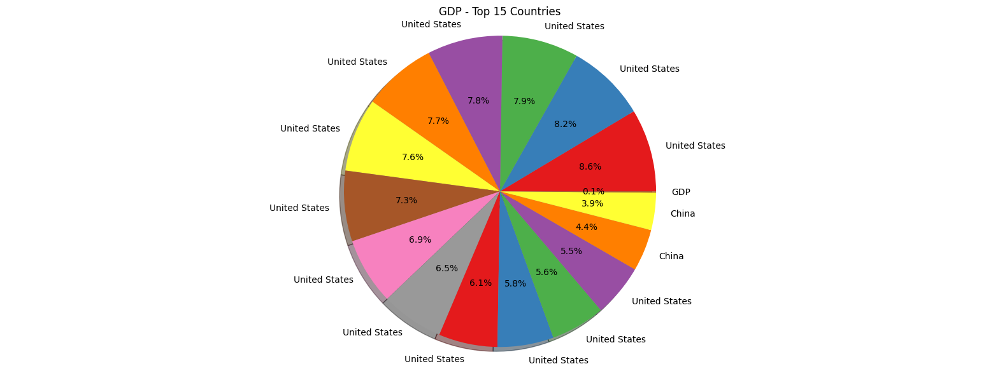

...

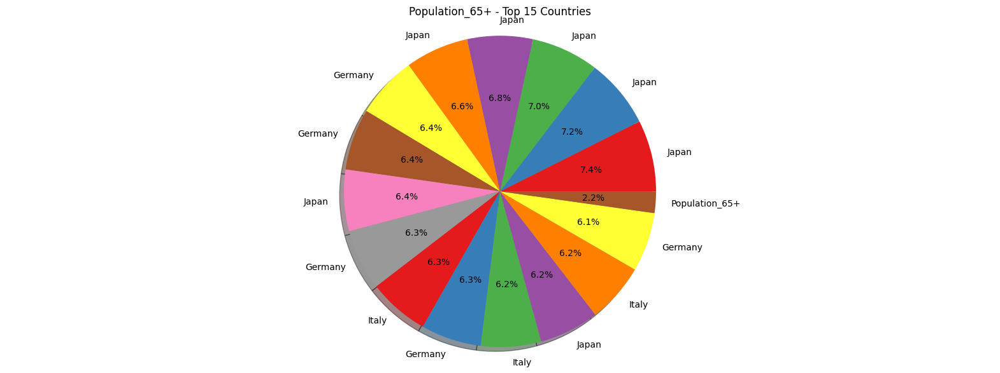

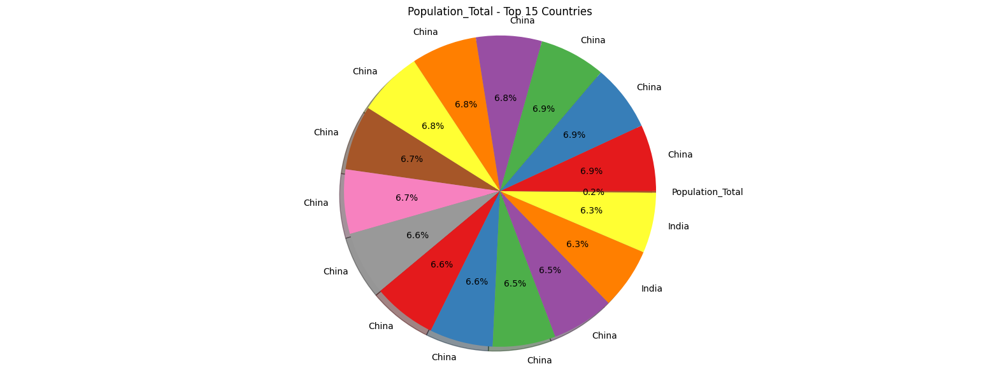

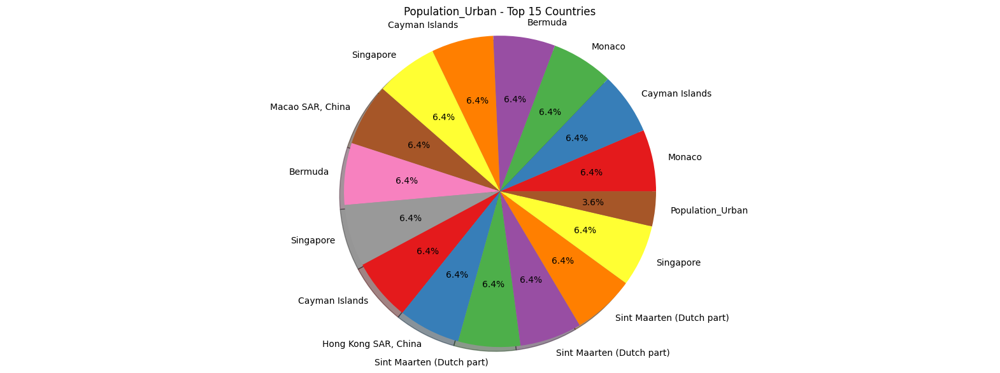

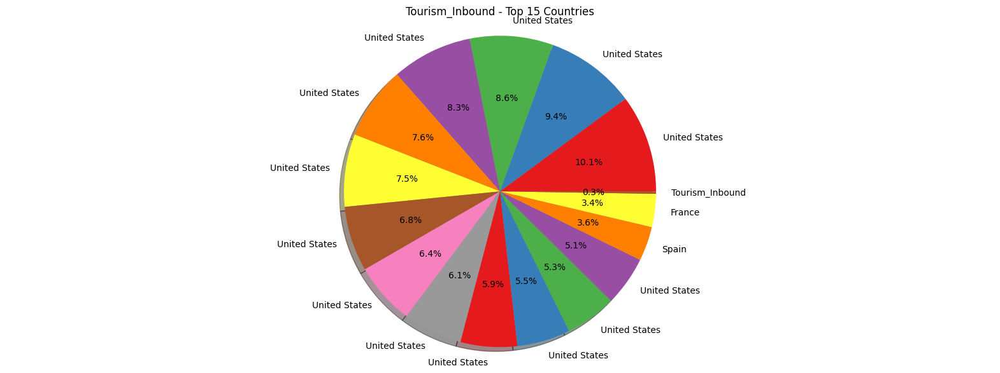

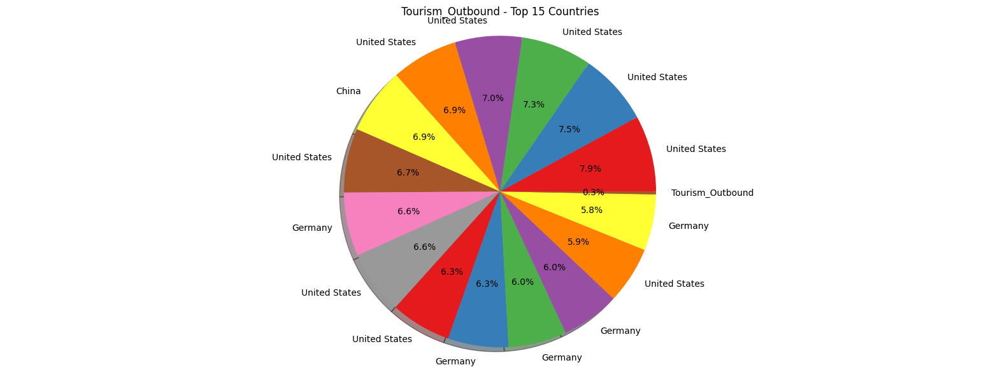

In [ ]:
# Plotting pie plots
cols = ['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions', 'Energy_Usage', 'GDP',
       'Health_Exp%_GDP','Internet_Usage', 'Population_0-14', 'Population_15-64',
       'Population_65+', 'Population_Total', 'Population_Urban',
       'Tourism_Inbound', 'Tourism_Outbound']
for col in cols:
    top_values = data2.sort_values(col,ascending=False).head(15)
    mean = pd.DataFrame({'Country':[col], col:[data2[col].mean()]})
    combined = pd.concat([top_values[['Country',col]],mean],ignore_index=True)

    fig, ax = plt.subplots(figsize=(20,7))
    plt.title(col + ' - Top 15 Countries')
    colors = sns.color_palette("Set1", combined.shape[0]).as_hex()
    ax.pie(combined[col], labels=combined['Country'],colors=colors,autopct='%1.1f%%',shadow=True)
    ax.axis('equal')
    plt.show()

In [ ]:
data3 = data2.drop(columns = "Country", axis=1)

In [ ]:
data3.fillna(0,inplace=True)

In [ ]:
col = data3.columns

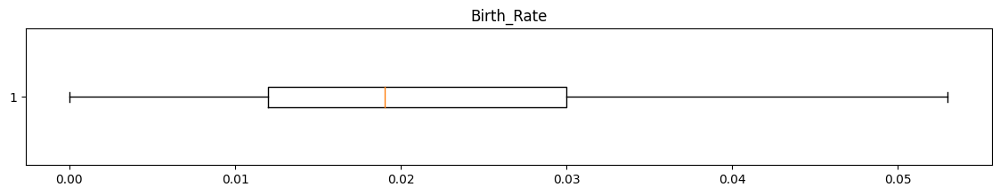

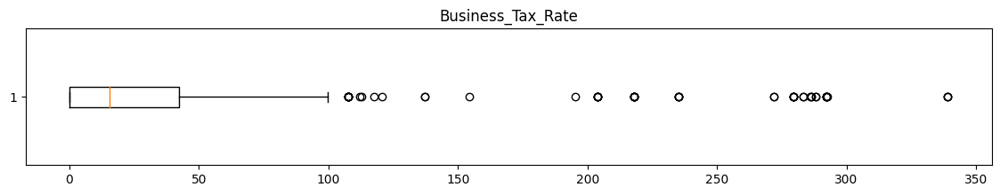

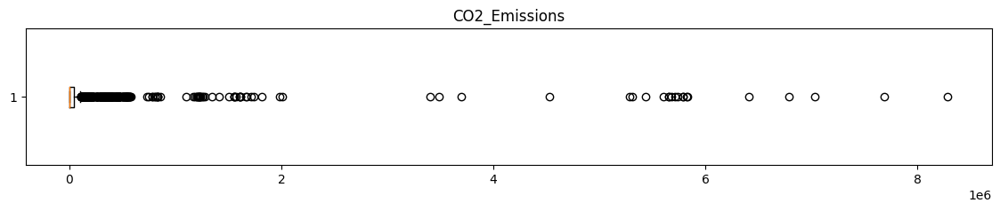

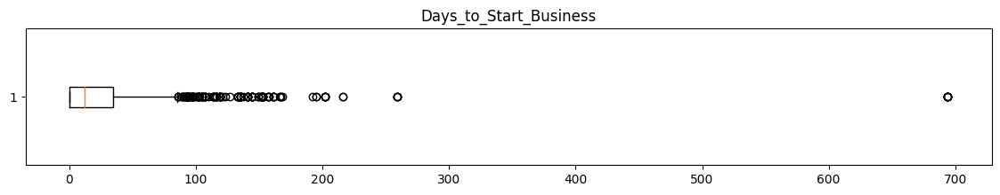

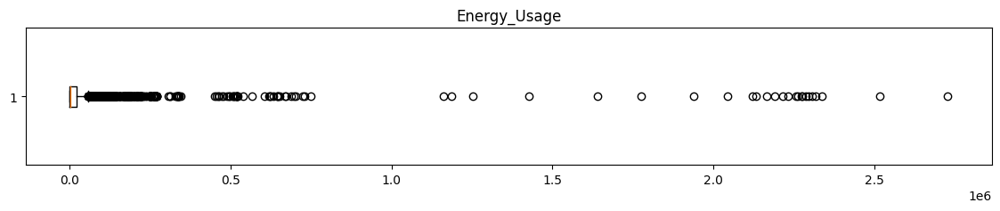

...

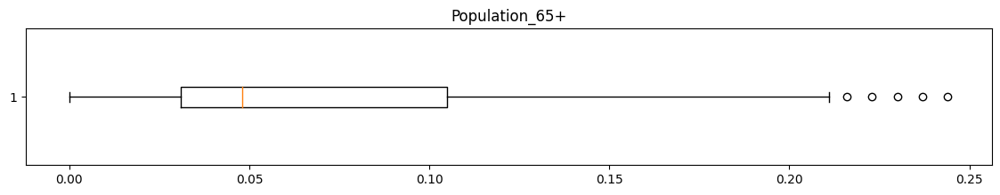

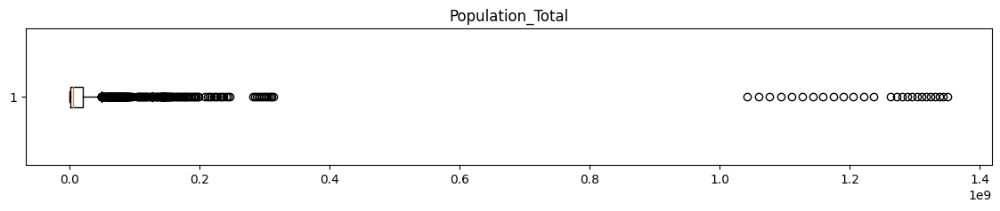

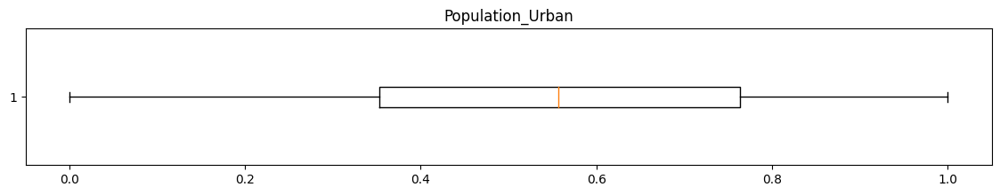

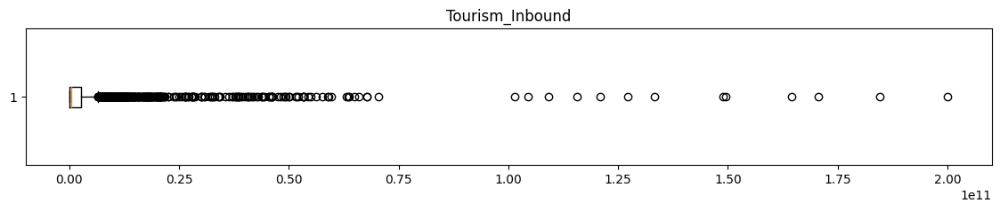

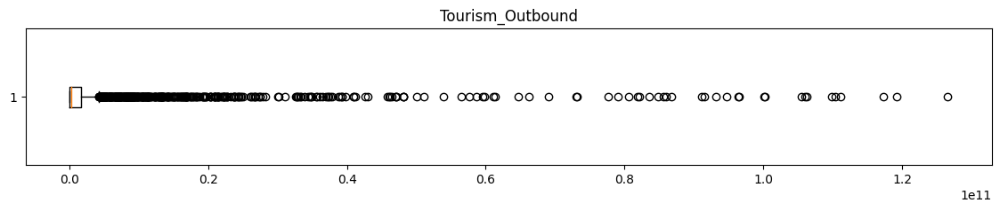

In [ ]:
# Whiskers Plots
for column in col:
  plt.figure(figsize=(14,2))
  plt.boxplot(data3[column].dropna(), vert=False)
  plt.title(column)
  plt.show()

# **Correlation Analysis**

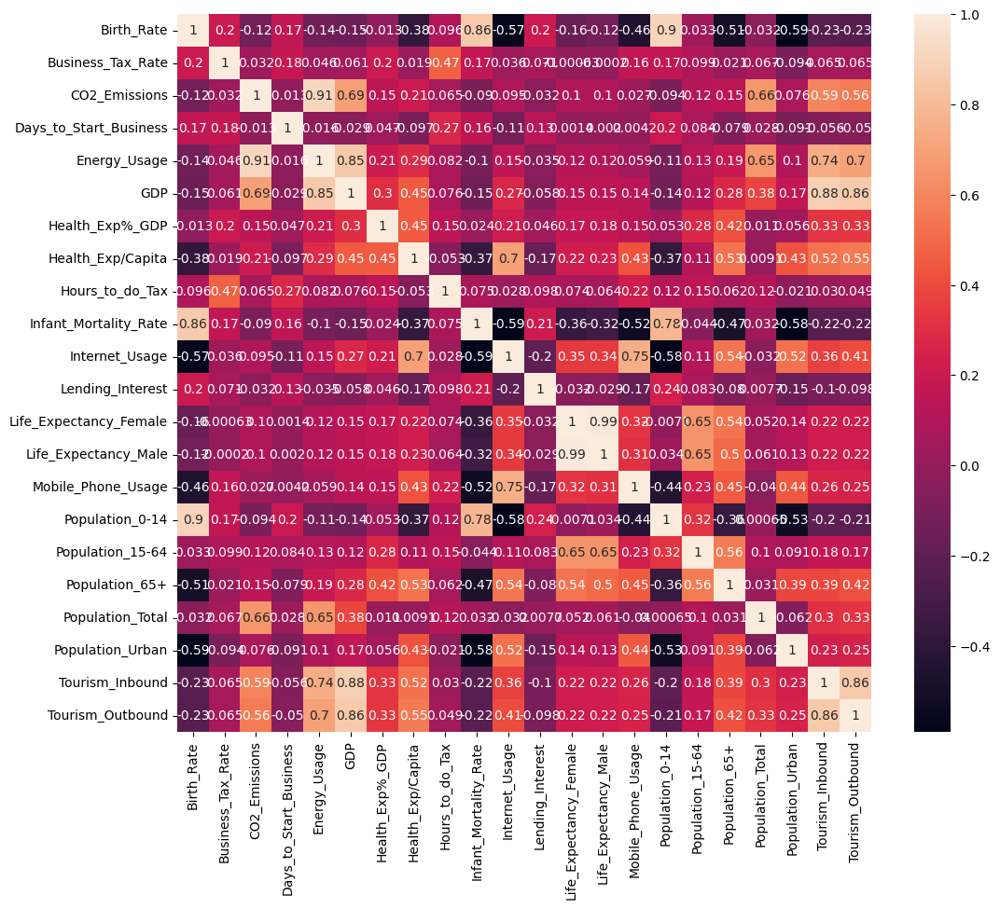

In [ ]:
plt.figure(figsize=(12,10))
sns.heatmap(data3.corr(), annot=True)
plt.show()

Text(0.5, 1.0, 'Pairplot for all numerical columns')

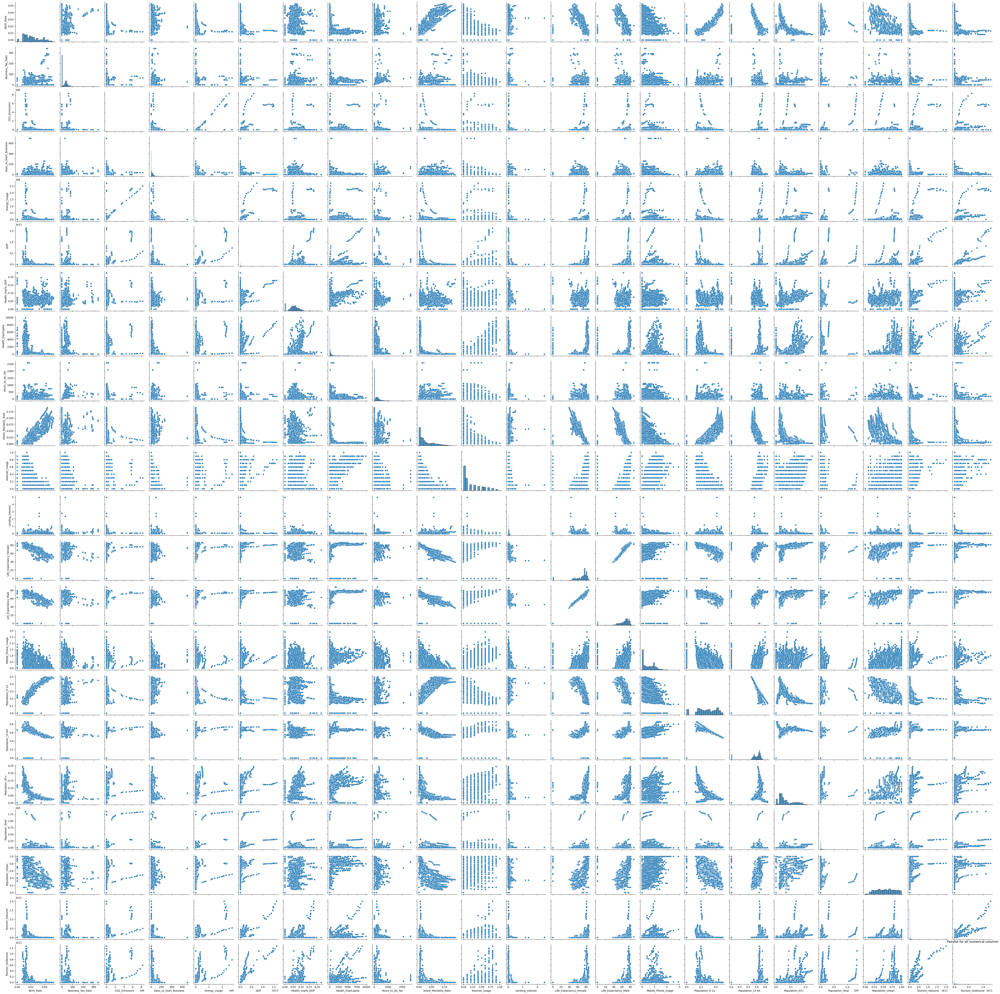

In [ ]:
sns.pairplot(data3)
plt.title("Pairplot for all numerical columns")

In [ ]:
data2.columns

Index(['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions', 'Country',
       'Days_to_Start_Business', 'Energy_Usage', 'GDP', 'Health_Exp%_GDP',
       'Health_Exp/Capita', 'Hours_to_do_Tax', 'Infant_Mortality_Rate',
       'Internet_Usage', 'Lending_Interest', 'Life_Expectancy_Female',
       'Life_Expectancy_Male', 'Mobile_Phone_Usage', 'Population_0-14',
       'Population_15-64', 'Population_65+', 'Population_Total',
       'Population_Urban', 'Tourism_Inbound', 'Tourism_Outbound'],
      dtype='object')

In [ ]:
#Scatterplots for two variables
fig = px.scatter(data2,x = 'Birth_Rate' ,
              y = 'Infant_Mortality_Rate',color="Country",
              title = 'Birth Rate vs Infant Mortality Rate')
fig.show()

In [ ]:
#Scatterplots for two variables
fig = px.scatter(data2,x = 'Population_Total' ,
              y = 'GDP',color="Country",
              title = 'Population Total vs GDP')
fig.show()

In [ ]:
#Scatterplots for two variables
fig = px.scatter(data2,x = 'CO2_Emissions' ,
              y = 'Energy_Usage',color="Country",
              title = 'CO2 Emissions vs Energy Usage')
fig.show()

In [ ]:
#Scatterplots for two variables
fig = px.scatter(data2,x = 'Tourism_Inbound' ,
              y = 'Tourism_Outbound',color="Country",
              title = 'Tourism_Inbound vs Tourism_Outbound')
fig.show()

# **Model Building**

### **Regression Model**

In [ ]:
model = smf.ols("Energy_Usage~CO2_Emissions",data=data3).fit() # Y ~ X OR Dependent Variable ~ Independent_Variable

In [ ]:
# coefficients - B0 & B1
model.params
# Regression equation :- CO = B0 + B1 * EU
# In o/p - Intercept = B0, CO = Coefficient of EU i.e. B1
# we assume Eu as 500

Intercept        11322.132128
CO2_Emissions        0.354669
dtype: float64

In [ ]:
CO = 11322.13 + 0.35 * 200
CO

11392.13

In [ ]:
model.rsquared, model.rsquared_adj

(0.8257788895035478, 0.8257144109282346)

* As we can see R squared values are 0.82 that means it is a Good Regression Equation

In [ ]:
model.summary()

<Axes: xlabel='CO2_Emissions', ylabel='Energy_Usage'>

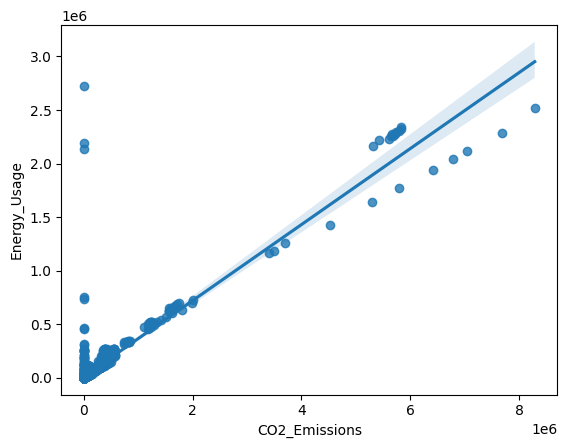

In [ ]:
sns.regplot(x="CO2_Emissions", y="Energy_Usage", data=data3)

In [ ]:
print("tvalues:\n",model.tvalues,'\n\npvalues:\n', model.pvalues)
# B0 = 11322.13, B1 = 0.35

tvalues:
 Intercept          6.448031
CO2_Emissions    113.168138
dtype: float64 

pvalues:
 Intercept        1.337573e-10
CO2_Emissions    0.000000e+00
dtype: float64


* As we can see pvalues are 1.337573e-10 i.e. 1.33 + 10^-10 i.e. = 0 and 0.000000e+00 i.e. 0.00 + 10^0 i.e. = 1 which is greater than  α=0.05 (1 > 0.05) also we can accept the alternate hypothesis. Therefore, we can go ahead and predict the model.

In [ ]:
newdata = pd.Series([200, 700])

In [ ]:
data_pred = pd.DataFrame(newdata,columns=['CO2_Emissions'])
data_pred

,CO2_Emissions
0,200
1,700


In [ ]:
model.predict(data_pred)

0    11393.065853
1    11570.400166
dtype: float64

In [ ]:
data3.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.020,0.0,87931.0,0.0,26998.0,54790058957,0.035,60.0,0.0,0.034,...,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,0.0,9542.0,0.0,7499.0,9129594819,0.034,22.0,0.0,0.128,...,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,0.0,1617.0,0.0,1983.0,2359122303,0.043,15.0,0.0,0.090,...,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,0.0,4276.0,0.0,1836.0,5788311645,0.047,152.0,0.0,0.054,...,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,0.0,1041.0,0.0,0.0,2610959139,0.051,12.0,0.0,0.096,...,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


#### Standardizing Data

In [ ]:
data3.columns

Index(['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions',
       'Days_to_Start_Business', 'Energy_Usage', 'GDP', 'Health_Exp%_GDP',
       'Health_Exp/Capita', 'Hours_to_do_Tax', 'Infant_Mortality_Rate',
       'Internet_Usage', 'Lending_Interest', 'Life_Expectancy_Female',
       'Life_Expectancy_Male', 'Mobile_Phone_Usage', 'Population_0-14',
       'Population_15-64', 'Population_65+', 'Population_Total',
       'Population_Urban', 'Tourism_Inbound', 'Tourism_Outbound'],
      dtype='object')

In [ ]:
sclr = MinMaxScaler()
scaled_info = sclr.fit_transform(data3)
scaled_df = pd.DataFrame(scaled_info, columns = data3.columns)
scaled_df.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.377358,0.0,0.010611,0.0,0.009898,0.003373,0.155556,0.006056,0.0,0.241135,...,0.816092,0.761364,0.000000,0.684,0.721445,0.159836,0.023470,0.599,0.000510,0.001525
1,0.943396,0.0,0.001151,0.0,0.002749,0.000562,0.151111,0.002220,0.0,0.907801,...,0.540230,0.500000,0.000000,0.952,0.581585,0.102459,0.010296,0.324,0.000170,0.001153
2,0.811321,0.0,0.000195,0.0,0.000727,0.000145,0.191111,0.001514,0.0,0.638298,...,0.655172,0.602273,0.000000,0.908,0.602564,0.118852,0.005131,0.383,0.000385,0.000395
3,0.509434,0.0,0.000516,0.0,0.000673,0.000356,0.208889,0.015341,0.0,0.382979,...,0.597701,0.556818,0.034483,0.766,0.684149,0.118852,0.001286,0.532,0.001134,0.001651
4,0.867925,0.0,0.000126,0.0,0.000000,0.000161,0.226667,0.001211,0.0,0.680851,...,0.597701,0.556818,0.000000,0.936,0.588578,0.114754,0.008580,0.178,0.000115,0.000237


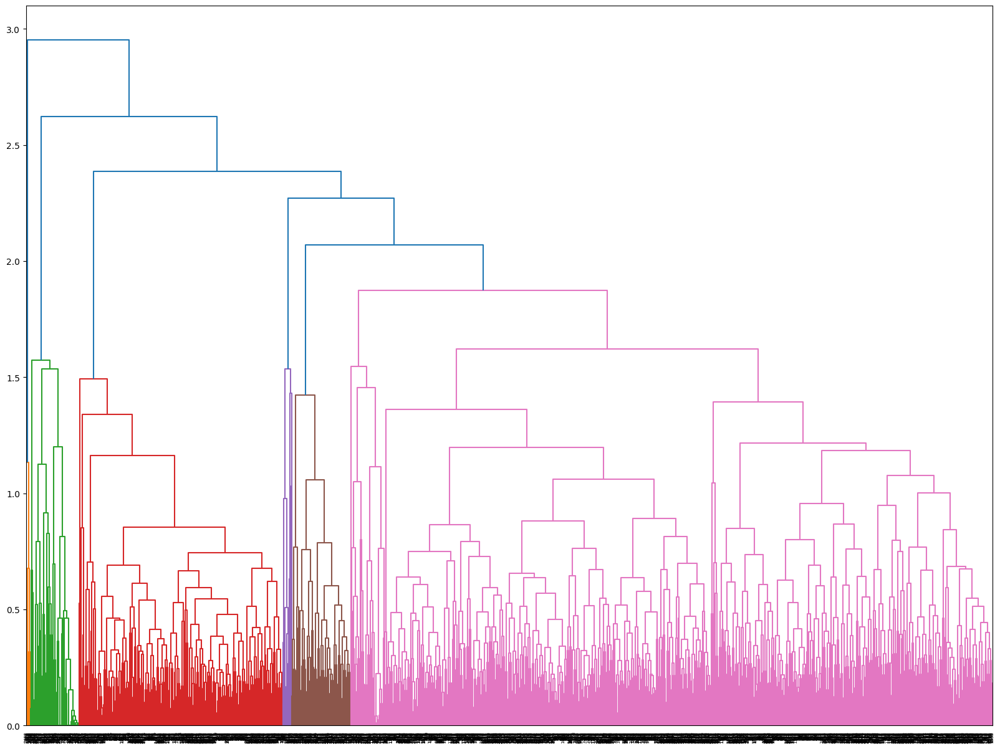

In [ ]:
plt.figure(figsize=(20,15))
dendrogram = sch.dendrogram(sch.linkage(scaled_info, method='complete'))

In [ ]:
hc = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')
hc

AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=4)

In [ ]:
y_hc = hc.fit_predict(scaled_info)
Clusters = pd.DataFrame(y_hc, columns = ['Clusters'])

In [ ]:
y_hc

array([0, 1, 1, ..., 0, 0, 0])

In [ ]:
Clusters

,Clusters
0,0
1,1
2,1
3,0
4,1
...,...
2699,2
2700,3
2701,0
2702,0


In [ ]:
data3['h_clusterid'] = Clusters

In [ ]:
data3

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,h_clusterid
0,0.020,0.0,87931.0,0.0,26998.0,54790058957,0.035,60.0,0.0,0.034,...,67.0,0.0,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08,0
1,0.050,0.0,9542.0,0.0,7499.0,9129594819,0.034,22.0,0.0,0.128,...,44.0,0.0,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08,1
2,0.043,0.0,1617.0,0.0,1983.0,2359122303,0.043,15.0,0.0,0.090,...,53.0,0.0,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07,1
3,0.027,0.0,4276.0,0.0,1836.0,5788311645,0.047,152.0,0.0,0.054,...,49.0,0.1,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08,0
4,0.046,0.0,1041.0,0.0,0.0,2610959139,0.051,12.0,0.0,0.096,...,49.0,0.0,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.000,0.0,0.0,0.0,0.0,0,0.000,0.0,0.0,0.000,...,0.0,0.0,0.000,0.000,0.000,32427,0.911,0.000000e+00,0.000000e+00,2
2700,0.013,46.4,0.0,5.0,2132446.0,16244600000000,0.179,8895.0,175.0,0.006,...,76.0,1.0,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11,3
2701,0.015,41.9,0.0,7.0,0.0,50004354667,0.089,1308.0,310.0,0.010,...,74.0,1.5,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09,0
2702,0.020,61.9,0.0,144.0,0.0,381286223859,0.046,593.0,792.0,0.013,...,72.0,1.0,0.288,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09,0


In [ ]:
data4 = data3.sort_values("h_clusterid")
data4.iloc[:,[2,22]]

,CO2_Emissions,h_clusterid
0,87931.0,0
1698,3579.0,0
1702,84.0,0
1704,708.0,0
1707,465023.0,0
...,...,...
2076,5311840.0,3
412,5601405.0,3
1036,5790765.0,3
620,5650950.0,3


In [ ]:
data3.h_clusterid.unique()

array([0, 1, 2, 3])

In [ ]:
data3['h_clusterid'].value_counts()

0    1986
1     569
2     136
3      13
Name: h_clusterid, dtype: int64

We got 4 clusters by Aglomerative Clustering method

In [ ]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
from math import isnan
from sklearn.metrics import silhouette_score

In [ ]:
sh_score = silhouette_score(scaled_info,hc.labels_)
print("Silhouette Score:",sh_score)

Silhouette Score: 0.2986752717567368


In [ ]:
from sklearn import metrics
print("Calinski Harabasz Score : %0.3f"%metrics.calinski_harabasz_score(pca_values, model2.labels_))

Calinski Harabasz Score : 2529.953


### **K-Means**

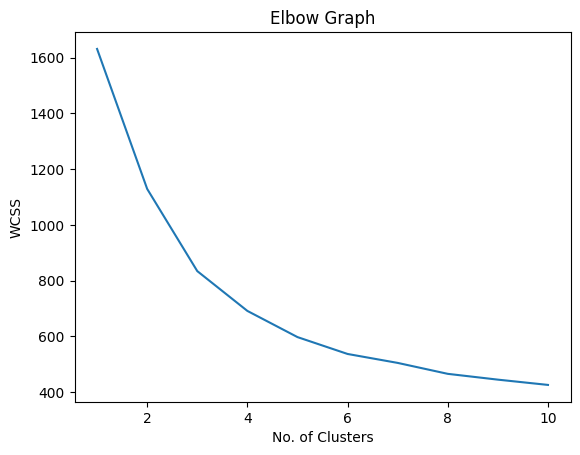

In [ ]:
wcss = []
for i in range(1,11):
  kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=400, random_state=0)

  kmeans.fit(scaled_info)
  wcss.append(kmeans.inertia_)

plt.plot(range(1,11),wcss)
plt.title("Elbow Graph")
plt.xlabel("No. of Clusters")
plt.ylabel("WCSS")
plt.show()

In [ ]:
wcss

[1631.8221363039675,
 1129.0174054387344,
 833.7516996937509,
 690.7777290479058,
 596.7512467741655,
 536.1486132990118,
 504.0389786453594,
 464.7483714363276,
 443.91419751648743,
 424.9550209703758]

Optimal number of clusters:  4


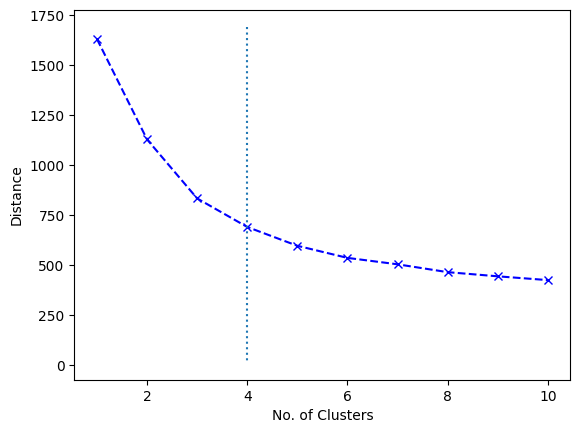

In [ ]:
y = wcss
x = range(1,len(y)+1)

kn = KneeLocator(x, y, curve="convex", direction='decreasing')
print("Optimal number of clusters: ",kn.knee)

plt.plot(x,y,'bx--')
plt.xlabel("No. of Clusters")
plt.ylabel("Distance")
plt.vlines(kn.knee, plt.ylim()[1], plt.xlim()[1], linestyles='dotted')
plt.show()

In [ ]:
model2 = KMeans(n_clusters=4, random_state=5, init='k-means++', n_init=15, max_iter=400)
num_clusters = model2.fit_predict(scaled_info)

In [ ]:
data3['KMeans_cluster'] = num_clusters

In [ ]:
data3['KMeans_cluster'].value_counts()

0    1092
3     786
1     690
2     136
Name: KMeans_cluster, dtype: int64

We have got 4 clusters again by using K-Means clustering method

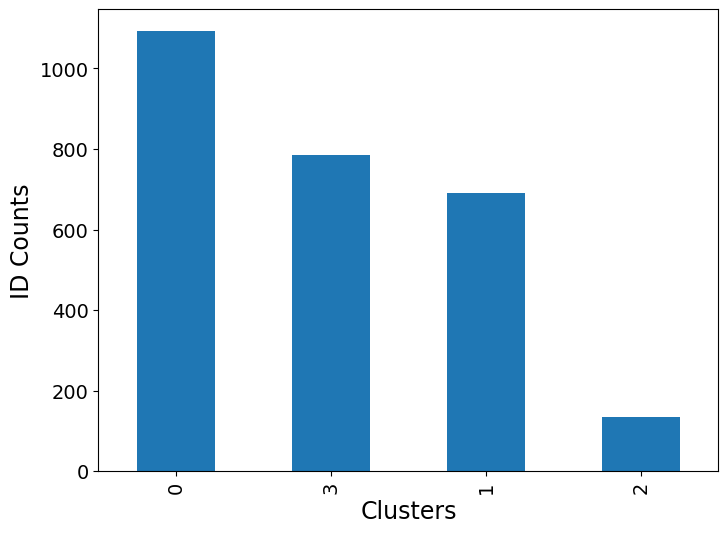

In [ ]:
data3['KMeans_cluster'].value_counts().plot(kind='bar', figsize=(8,6))
plt.xlabel("Clusters", fontsize=17)
plt.ylabel("ID Counts", fontsize=17)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [ ]:
kmeans_sh_score = silhouette_score(scaled_info, model2.labels_)
print("Silhouette Score:", kmeans_sh_score)

Silhouette Score: 0.2842075589909547


In [ ]:
data3.groupby('KMeans_cluster').mean().round(1).reset_index()

,KMeans_cluster,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,...,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,h_clusterid
0,0,0.0,20.4,119270.1,26.9,45113.7,1.051332e+11,0.1,253.6,156.6,...,69.1,0.5,0.3,0.6,0.1,38789016.0,0.6,2.262883e+09,1.511810e+09,0.0
1,1,0.0,26.6,227899.8,14.9,115885.9,7.653226e+11,0.1,2146.9,167.0,...,75.0,1.0,0.2,0.6,0.1,29870348.3,0.8,1.284487e+10,1.259954e+10,0.1
2,2,0.0,9.4,136.0,3.4,4.4,8.011582e+08,0.0,872.3,25.8,...,0.0,0.5,0.0,0.0,0.0,58804.3,0.8,1.338169e+08,2.669926e+07,2.0
3,3,0.0,35.3,18944.3,36.4,10994.5,1.916660e+10,0.1,53.9,175.6,...,55.3,0.2,0.4,0.5,0.0,28097175.0,0.3,2.366697e+08,2.705095e+08,0.7


# **Principal Component Analysis**

In [ ]:
from sklearn.decomposition import PCA
pca = PCA()
pca_values = pca.fit_transform(scaled_df)
variance = pca.explained_variance_ratio_
variance

array([4.29885803e-01, 2.09397064e-01, 7.55420415e-02, 5.90818312e-02,
       5.21054228e-02, 3.75671149e-02, 3.07386624e-02, 2.37375819e-02,
       1.63159377e-02, 1.24262050e-02, 1.11079393e-02, 9.20806452e-03,
       7.88000121e-03, 7.50937841e-03, 6.74671540e-03, 3.44395357e-03,
       3.03732232e-03, 1.53591102e-03, 1.30113795e-03, 7.56224291e-04,
       3.58542223e-04, 3.17145847e-04])

In [ ]:
var_cumulative = np.cumsum(np.round(variance, decimals=3)*100)
var_cumulative

array([ 43. ,  63.9,  71.5,  77.4,  82.6,  86.4,  89.5,  91.9,  93.5,
        94.7,  95.8,  96.7,  97.5,  98.3,  99. ,  99.3,  99.6,  99.8,
        99.9, 100. , 100. , 100. ])

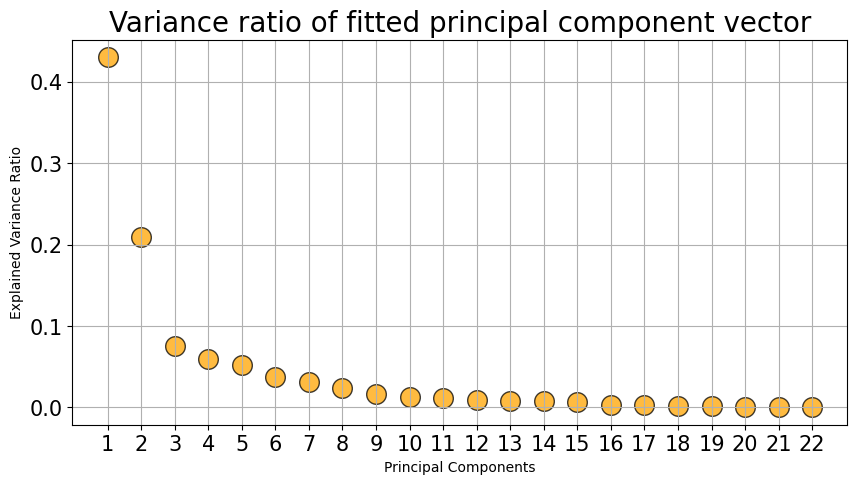

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(x = [i+1 for i in range(len(pca.explained_variance_ratio_))],
            y = pca.explained_variance_ratio_,
            s = 200, alpha=0.75, c = 'orange', edgecolor='k')
plt.grid(True)
plt.title("Variance ratio of fitted principal component vector", fontsize=20)
plt.xlabel("Principal Components")
plt.ylabel("Explained Variance Ratio")
plt.xticks([i+1 for i in range(len(pca.explained_variance_ratio_))], fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [ ]:
# PCA for 4 components
pca = PCA(n_components=4)
pca_values = pca.fit_transform(scaled_df)
variance = pca.explained_variance_ratio_
variance

array([0.4298858 , 0.20939706, 0.07554204, 0.05908183])

In [ ]:
var_cumulative = np.cumsum(np.round(variance, decimals=4)*100)
var_cumulative

array([42.99, 63.93, 71.48, 77.39])

In [ ]:
pca_df = pd.DataFrame(pca_values, columns=["PCA_1", "PCA_2", "PCA_3", "PCA_4"])
pca_df.head(10)

,PCA_1,PCA_2,PCA_3,PCA_4
0,-0.206669,-0.037312,-0.228966,-0.170783
1,-0.997550,-0.034299,0.308282,-0.051326
2,-0.761073,-0.071354,0.133328,-0.057298
3,-0.444730,0.092907,0.008406,-0.176622
4,-0.900921,-0.072725,0.184103,0.096986
5,-0.923057,-0.050450,0.187543,0.170268
6,-0.735121,-0.028598,0.164796,-0.125992
7,-0.801178,0.048470,0.235704,-0.088680
8,-0.981491,-0.070238,0.288230,0.052113
9,-0.679420,-0.069385,0.016421,0.039924


In [ ]:
plt.figure(figsize=(30, 25))
fig = px.scatter_matrix(pca_values,
    labels={
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(variance * 100)
},
    dimensions=range(4),
    color=data2['Country']
)
fig.update_traces(diagonal_visible=False,)
fig.show()

<Figure size 3000x2500 with 0 Axes>

# **Agglomeritive Clustering using PCA values**

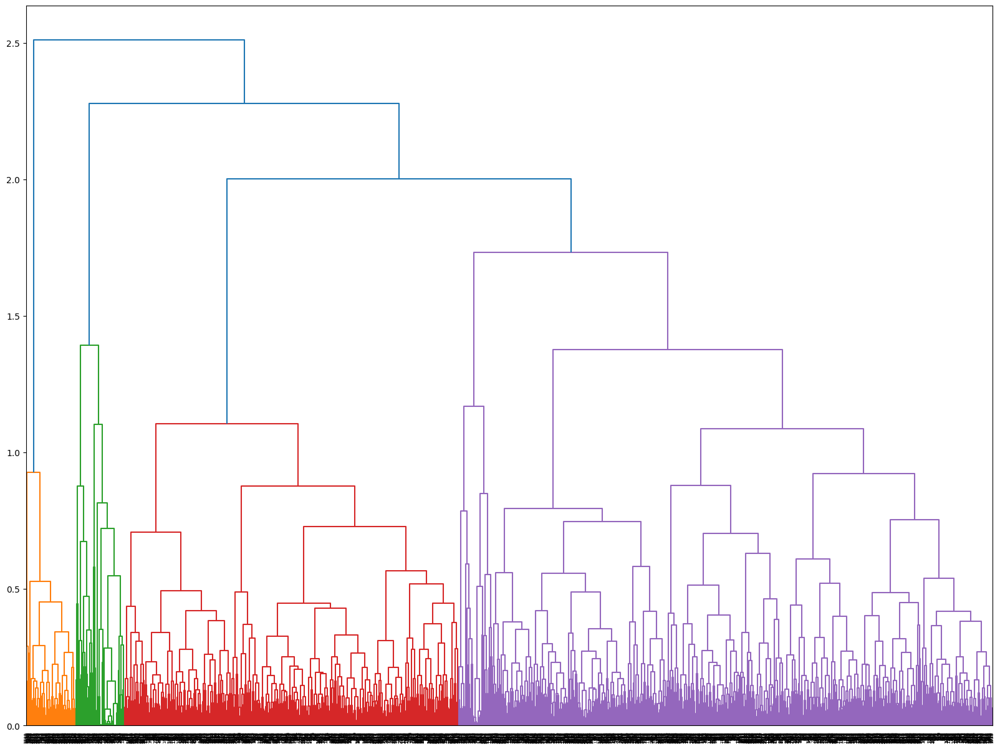

In [ ]:
data5 = data2.copy()
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(20,15))
dendogram2 = sch.dendrogram(sch.linkage(pca_values,"complete"))

In [ ]:
model3 = AgglomerativeClustering(n_clusters=4,affinity="euclidean",linkage="complete")
num_clusters = model3.fit_predict(pca_values)

In [ ]:
data5['H_Clusters'] = num_clusters

In [ ]:
data5.H_Clusters.unique()

array([0, 1, 2, 3])

In [ ]:
data5['H_Clusters'].value_counts()

0    1494
1     935
3     139
2     136
Name: H_Clusters, dtype: int64

In [ ]:
SH_score= silhouette_score(pca_values, model3.labels_)
print('silhouette score: ',SH_score)

silhouette score:  0.37028414415453004


# **KMeans Clustering using PCA Values**

In [ ]:
data5 = data5.drop(columns=['H_Clusters'], axis=1)

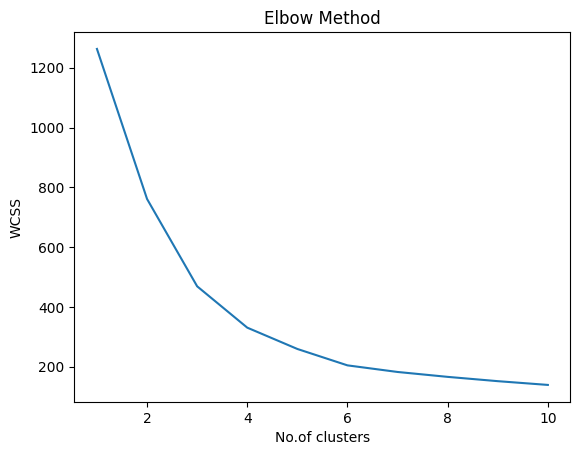

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    k = KMeans(n_clusters=i, init='k-means++', n_init=15, max_iter=400, random_state=5).fit(pca_values)
    wcss.append(k.inertia_)
plt.plot(range(1,11),wcss)
plt.title('Elbow Method')
plt.xlabel('No.of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
# We will also use the Silhouette score to determine an optimal number.
k = [2,3,4,5,6,7,8,9,10]

for n_clusters in k:
    cluster1 = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels1 = cluster1.fit_predict(pca_values)
    SH_score1= silhouette_score(pca_values, cluster_labels1)
    print("For n_clusters =", n_clusters,"The average silhouette_score is :", SH_score1)

For n_clusters = 2 The average silhouette_score is : 0.398697039251277
For n_clusters = 3 The average silhouette_score is : 0.46166623982700755
For n_clusters = 4 The average silhouette_score is : 0.4102871581780262
For n_clusters = 5 The average silhouette_score is : 0.43564453047746227
For n_clusters = 6 The average silhouette_score is : 0.3929121146924546
For n_clusters = 7 The average silhouette_score is : 0.35427655225578464
For n_clusters = 8 The average silhouette_score is : 0.3217929208603967
For n_clusters = 9 The average silhouette_score is : 0.33130680148712593
For n_clusters = 10 The average silhouette_score is : 0.3330684708549416


No. of Optimal Clusters is  4


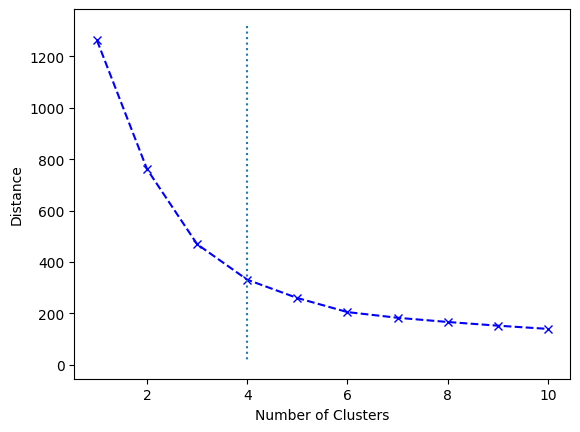

In [ ]:
from kneed import KneeLocator

y = wcss
x = range(1, len(y)+1)

kn = KneeLocator(x, y, curve= 'convex', direction='decreasing')
print("No. of Optimal Clusters is ", kn.knee)

plt.plot(x, y, 'bx--')
plt.xlabel('Number of Clusters')
plt.ylabel('Distance')
plt.vlines(kn.knee, plt.ylim()[1], plt.xlim()[1], linestyles='dotted')
plt.show()

In [ ]:
kmeans_model=KMeans(n_clusters=4, init='k-means++', n_init=15, max_iter=400, random_state=5)
cluster_numbers = kmeans_model.fit_predict(pca_values)

# **KNN Imputation**

In [ ]:
afterImputation_data = median_data[['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions', 'Country',
       'Days_to_Start_Business', 'Energy_Usage', 'GDP', 'Health_Exp%_GDP',
       'Health_Exp/Capita', 'Hours_to_do_Tax', 'Infant_Mortality_Rate',
       'Internet_Usage', 'Lending_Interest', 'Life_Expectancy_Female',
       'Life_Expectancy_Male', 'Mobile_Phone_Usage', 'Population_0-14',
       'Population_15-64', 'Population_65+', 'Population_Total',
       'Population_Urban', 'Tourism_Inbound', 'Tourism_Outbound']]

In [ ]:
pd.set_option('display.max_columns', None)
data2.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.020,NaN,87931.0,Algeria,NaN,26998.0,54790058957,0.035,60.0,NaN,0.034,0.0,0.100,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,NaN,9542.0,Angola,NaN,7499.0,9129594819,0.034,22.0,NaN,0.128,0.0,1.032,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,NaN,1617.0,Benin,NaN,1983.0,2359122303,0.043,15.0,NaN,0.090,0.0,NaN,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,NaN,4276.0,Botswana,NaN,1836.0,5788311645,0.047,152.0,NaN,0.054,0.0,0.155,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,2610959139,0.051,12.0,NaN,0.096,0.0,NaN,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


In [ ]:
afterImputation_data.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.020,73.7125,87931.0,Algeria,25.0,26998.0,54790058957,0.035,60.0,451.00,0.034,0.0,0.100,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,52.1000,9542.0,Angola,92.9,7499.0,9129594819,0.034,22.0,275.75,0.128,0.0,1.032,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,71.0875,1617.0,Benin,30.4,1983.0,2359122303,0.043,15.0,270.00,0.090,0.0,0.118,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,18.7250,4276.0,Botswana,85.2,1836.0,5788311645,0.047,152.0,144.50,0.054,0.0,0.155,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,45.4875,1041.0,Burkina Faso,24.2,9308.0,2610959139,0.051,12.0,270.00,0.096,0.0,0.118,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


In [ ]:
afterImputation_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Birth_Rate,2704.0,2.248102e-02,1.121762e-02,0.007,1.300000e-02,2.000000e-02,3.000000e-02,5.300000e-02
Business_Tax_Rate,2704.0,4.757906e+01,3.734163e+01,8.200,3.346250e+01,4.095000e+01,4.910000e+01,3.391000e+02
CO2_Emissions,2704.0,1.328176e+05,5.927623e+05,7.000,1.566000e+03,8.196000e+03,5.422825e+04,8.286892e+06
Days_to_Start_Business,2704.0,3.914724e+01,5.613864e+01,1.000,1.630000e+01,2.700000e+01,4.110000e+01,6.940000e+02
Energy_Usage,2704.0,5.494211e+04,2.171450e+05,8.000,3.019500e+03,9.308000e+03,2.524700e+04,2.727728e+06
GDP,2704.0,2.433624e+11,1.087427e+12,0.000,2.025005e+09,1.201895e+10,9.101825e+10,1.624460e+13
Health_Exp%_GDP,2704.0,6.371362e-02,2.491185e-02,0.008,4.775000e-02,6.100000e-02,7.600000e-02,2.250000e-01
Health_Exp/Capita,2704.0,7.310519e+02,1.400472e+03,2.000,5.700000e+01,1.910000e+02,5.512500e+02,9.908000e+03
Hours_to_do_Tax,2704.0,2.924869e+02,2.540412e+02,12.000,1.640000e+02,2.372500e+02,3.358750e+02,2.600000e+03
Infant_Mortality_Rate,2704.0,3.158099e-02,2.873929e-02,0.002,1.000000e-02,2.000000e-02,4.900000e-02,1.410000e-01


In [ ]:
afterImputation_data.duplicated().sum()

0

In [ ]:
afterImputation_data['Cluster'] = cluster_numbers

In [ ]:
afterImputation_data['Cluster'].value_counts()

1    1077
2     868
3     623
0     136
Name: Cluster, dtype: int64

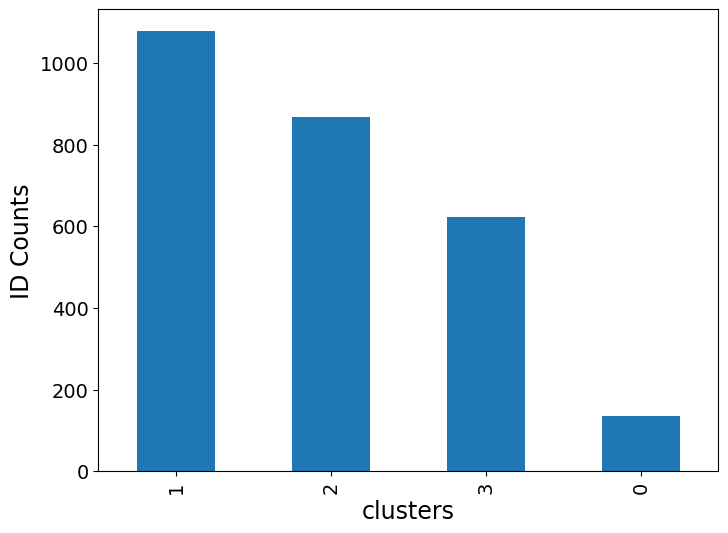

In [ ]:
import matplotlib.pyplot as plt

afterImputation_data['Cluster'].value_counts().plot(kind='bar',figsize = (8,6))
plt.xlabel("clusters",loc="center",fontsize=17)
plt.ylabel("ID Counts",loc="center",fontsize=17)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.show()

In [ ]:
KMeans_SH_score = silhouette_score(pca_values, kmeans_model.labels_)
print('silhouette score: ',KMeans_SH_score)

silhouette score:  0.41082048930629633


In [ ]:
print("Calinski Harabasz Score : %0.3f"%metrics.calinski_harabasz_score(pca_values, kmeans_model.labels_))

Calinski Harabasz Score : 2537.461


In [ ]:
afterImputation_data.groupby('Cluster').mean().round(1).reset_index()

,Cluster,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0,0.0,43.7,3603.3,24.5,6723.9,8.011582e+08,0.1,972.0,208.8,0.0,0.3,0.1,75.8,70.0,0.7,0.3,0.6,0.1,58804.3,0.8,4.090996e+08,2.312374e+08
1,1,0.0,41.8,118757.1,41.8,44400.2,1.002459e+11,0.1,297.8,321.7,0.0,0.2,0.1,75.4,69.7,0.6,0.3,0.7,0.1,33950837.3,0.6,2.424096e+09,1.611343e+09
2,2,0.0,59.9,28186.1,51.6,16838.9,2.403511e+10,0.1,68.0,312.9,0.1,0.0,0.2,58.8,56.1,0.2,0.4,0.5,0.0,31071642.6,0.3,3.499009e+08,3.734911e+08
3,3,0.0,41.2,331110.4,20.3,136779.9,8.493029e+11,0.1,2351.2,231.7,0.0,0.6,0.1,81.1,75.3,1.1,0.2,0.7,0.1,34538182.7,0.8,1.408730e+10,1.394282e+10


In [ ]:
cluster_df1 = afterImputation_data.copy()
cluster_df1

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Cluster
0,0.020,73.7125,8.793100e+04,Algeria,25.0,2.699800e+04,54790058957,0.035,60.0,451.00,0.034,0.0,0.100,71.0,67.0,0.000000,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08,1
1,0.050,52.1000,9.542000e+03,Angola,92.9,7.499000e+03,9129594819,0.034,22.0,275.75,0.128,0.0,1.032,47.0,44.0,0.000000,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08,2
2,0.043,71.0875,1.617000e+03,Benin,30.4,1.983000e+03,2359122303,0.043,15.0,270.00,0.090,0.0,0.118,57.0,53.0,0.000000,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07,2
3,0.027,18.7250,4.276000e+03,Botswana,85.2,1.836000e+03,5788311645,0.047,152.0,144.50,0.054,0.0,0.155,52.0,49.0,0.100000,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08,2
4,0.046,45.4875,1.041000e+03,Burkina Faso,24.2,9.308000e+03,2610959139,0.051,12.0,270.00,0.096,0.0,0.118,52.0,49.0,0.000000,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,40.9500,1.124545e+02,Turks and Caicos Islands,27.0,9.308000e+03,0,0.061,191.0,237.25,0.020,0.1,0.118,75.0,69.0,0.500000,0.298,0.643,0.053,32427,0.911,2.960000e+08,3.940000e+08,0
2700,0.013,46.4000,5.657526e+06,United States,5.0,2.132446e+06,16244600000000,0.179,8895.0,175.00,0.006,0.8,0.033,81.0,76.0,1.000000,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11,3
2701,0.015,41.9000,6.046818e+03,Uruguay,7.0,3.328083e+03,50004354667,0.089,1308.0,310.00,0.010,0.5,0.112,80.0,74.0,1.500000,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09,3
2702,0.020,61.9000,1.801557e+05,"Venezuela, RB",144.0,6.326858e+04,381286223859,0.046,593.0,792.00,0.013,0.5,0.164,78.0,72.0,1.000000,0.288,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09,3


In [ ]:
DF_Cluster_1 = cluster_df1[cluster_df1["Cluster"]==0]
DF_Cluster_1

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Cluster
40,0.019000,42.2375,565.000000,Seychelles,39.0,233.00,614877971,0.048,371.0,76.00,0.012,0.1,0.107,77.363636,68.181818,0.3,0.282,0.637,0.081,81131,0.501,225000000.0,44000000.0,0
88,0.011000,40.9500,524.000000,Andorra,27.0,9308.00,1133644295,0.062,1330.0,237.25,0.004,0.1,0.118,75.000000,69.000000,0.4,0.298,0.643,0.053,65399,0.924,629000000.0,394000000.0,0
107,0.011000,40.9500,8196.000000,Isle of Man,27.0,9308.00,1563667800,0.061,191.0,237.25,0.020,0.1,0.118,82.000000,75.000000,0.5,0.298,0.643,0.053,76806,0.518,629000000.0,394000000.0,0
117,0.020000,40.9500,8196.000000,Monaco,27.0,9308.00,2647883820,0.033,2685.0,237.25,0.004,0.4,0.118,75.000000,69.000000,0.4,0.298,0.643,0.053,32081,1.000,629000000.0,394000000.0,0
148,0.020500,40.9500,8196.000000,American Samoa,27.0,9308.00,0,0.061,191.0,237.25,0.020,0.1,0.118,75.000000,69.000000,0.0,0.298,0.643,0.053,57522,0.886,629000000.0,394000000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2675,0.014333,37.1000,119.090909,Dominica,12.0,41.25,495555556,0.059,392.0,117.00,0.011,0.6,0.090,79.000000,75.000000,1.5,0.298,0.643,0.053,71684,0.687,110000000.0,13000000.0,0
2679,0.014000,40.9500,582.363636,Greenland,27.0,9308.00,0,0.061,191.0,237.25,0.020,0.6,0.118,71.727273,66.636364,1.0,0.298,0.643,0.053,56810,0.852,629000000.0,394000000.0,0
2692,0.013000,40.9500,8196.000000,Sint Maarten (Dutch part),27.0,9308.00,0,0.061,191.0,237.25,0.020,0.1,0.118,77.333333,72.333333,0.5,0.298,0.643,0.053,39088,1.000,854000000.0,120000000.0,0
2693,0.017000,51.9000,218.909091,St. Kitts and Nevis,19.0,79.25,731851852,0.059,825.0,203.00,0.008,0.8,0.087,74.000000,69.000000,1.4,0.298,0.643,0.053,53584,0.318,94000000.0,14000000.0,0


In [ ]:
DF_Cluster_2 = cluster_df1[cluster_df1["Cluster"]==1]
DF_Cluster_2

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Cluster
0,0.020,73.7125,87931.000000,Algeria,25.000000,26998.000000,54790058957,0.035,60.0,451.00,0.034,0.0,0.100,71.0,67.0,0.000000,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08,1
14,0.025,45.2000,141326.000000,"Egypt, Arab Rep.",16.500000,40658.000000,99838540997,0.054,79.0,532.50,0.036,0.0,0.132,71.0,66.0,0.000000,0.354,0.592,0.053,66136590,0.428,4.657000e+09,1.206000e+09,1
26,0.022,31.6000,47114.000000,Libya,35.000000,15901.000000,33896600871,0.034,252.0,889.00,0.024,0.0,0.070,74.0,70.0,0.000000,0.333,0.628,0.039,5176185,0.763,8.400000e+07,4.950000e+08,1
31,0.017,26.3250,2769.000000,Mauritius,19.444444,1115.750000,4582562398,0.037,146.0,161.00,0.016,0.1,0.208,75.0,68.0,0.200000,0.258,0.681,0.061,1186873,0.427,7.320000e+08,2.030000e+08,1
32,0.022,49.8500,33905.000000,Morocco,14.400000,10238.000000,37020609825,0.042,54.0,328.00,0.043,0.0,0.133,70.0,67.0,0.100000,0.341,0.613,0.047,28710123,0.533,2.280000e+09,5.060000e+08,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2695,0.016,40.9500,8196.000000,St. Martin (French part),27.000000,9308.000000,0,0.061,191.0,237.25,0.020,0.1,0.118,82.0,76.0,0.500000,0.298,0.643,0.053,30959,0.560,6.290000e+08,3.940000e+08,1
2696,0.017,38.7000,193.454545,St. Vincent and the Grenadines,10.000000,68.250000,694444444,0.052,340.0,111.00,0.018,0.5,0.094,75.0,70.0,1.200000,0.257,0.675,0.068,109373,0.495,9.300000e+07,1.400000e+07,1
2697,0.018,27.9000,2339.636364,Suriname,694.000000,697.000000,5012121212,0.059,521.0,199.00,0.021,0.3,0.117,74.0,68.0,1.100000,0.278,0.656,0.066,534541,0.662,7.900000e+07,5.800000e+07,1
2698,0.015,29.1000,34882.909091,Trinidad and Tobago,41.000000,16811.333333,23436342520,0.054,972.0,210.00,0.020,0.6,0.077,74.0,66.0,1.400000,0.207,0.705,0.088,1337439,0.088,5.212500e+08,1.596667e+08,1


In [ ]:
DF_Cluster_3 = cluster_df1[cluster_df1["Cluster"]==2]
DF_Cluster_3

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Cluster
1,0.050,52.1000,9542.000000,Angola,92.9,7499.000000,9129594819,0.034,22.0,275.750,0.128,0.0,1.032,47.0,44.0,0.0000,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08,2
2,0.043,71.0875,1617.000000,Benin,30.4,1983.000000,2359122303,0.043,15.0,270.000,0.090,0.0,0.118,57.0,53.0,0.0000,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07,2
3,0.027,18.7250,4276.000000,Botswana,85.2,1836.000000,5788311645,0.047,152.0,144.500,0.054,0.0,0.155,52.0,49.0,0.1000,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08,2
4,0.046,45.4875,1041.000000,Burkina Faso,24.2,9308.000000,2610959139,0.051,12.0,270.000,0.096,0.0,0.118,52.0,49.0,0.0000,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07,2
5,0.042,207.0250,301.000000,Burundi,12.5,9308.000000,870486066,0.063,7.0,182.375,0.092,0.0,0.158,49.0,47.0,0.0000,0.490,0.481,0.029,6674286,0.082,1.400000e+06,1.400000e+07,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2651,0.024,59.9000,124.818182,"Micronesia, Fed. Sts.",16.0,9308.000000,326160961,0.128,405.0,128.000,0.031,0.3,0.143,70.0,68.0,0.3000,0.358,0.602,0.039,103395,0.223,2.191667e+07,6.666667e+06,2
2654,0.029,42.1000,3812.363636,Papua New Guinea,53.0,9308.000000,15653921367,0.052,114.0,207.000,0.048,0.0,0.108,64.0,60.0,0.4000,0.384,0.588,0.029,7167010,0.130,4.725000e+06,7.254545e+07,2
2655,0.027,18.9000,153.545455,Samoa,9.0,57.000000,684273267,0.068,245.0,224.000,0.016,0.1,0.099,76.0,70.0,0.1375,0.379,0.570,0.051,188889,0.196,1.480000e+08,2.230000e+07,2
2656,0.031,25.3000,184.090909,Solomon Islands,9.0,59.750000,999972421,0.080,148.0,80.000,0.026,0.1,0.113,69.0,66.0,0.6000,0.404,0.563,0.033,549598,0.210,6.690000e+07,6.800000e+07,2


In [ ]:
DF_Cluster_4 = cluster_df1[cluster_df1["Cluster"]==3]
DF_Cluster_4

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Cluster
62,0.008,23.5500,4.046500e+04,"Hong Kong SAR, China",8.4,1.339200e+04,171668164083,0.061,191.0,79.75,0.020,0.3,0.095,84.0,78.0,0.8,0.173,0.717,0.110,6665000,1.000,8.198000e+09,1.250200e+10,3
65,0.009,51.6500,1.219589e+06,Japan,24.6,5.189640e+05,4731198760271,0.076,2834.0,342.50,0.003,0.3,0.021,85.0,78.0,0.5,0.146,0.682,0.172,126870000,0.786,5.970000e+09,4.264300e+10,3
79,0.012,26.3125,4.900600e+04,Singapore,4.9,1.869200e+04,95835970989,0.027,662.0,82.25,0.003,0.4,0.058,80.0,76.0,0.7,0.215,0.712,0.073,4027900,1.000,5.142000e+09,4.535000e+09,3
89,0.010,53.3375,6.369600e+04,Austria,25.0,2.855800e+04,192070749954,0.100,2403.0,170.00,0.005,0.3,0.118,81.0,75.0,0.8,0.170,0.675,0.155,8011566,0.658,1.138200e+10,7.001000e+09,3
91,0.011,57.1375,1.157090e+05,Belgium,17.5,5.850800e+04,232672747374,0.081,1845.0,156.00,0.005,0.3,0.080,81.0,75.0,0.5,0.176,0.655,0.169,10251250,0.971,6.592000e+09,9.429000e+09,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2672,0.015,55.3000,7.132000e+03,Costa Rica,60.0,3.918000e+03,45374788701,0.101,951.0,226.00,0.009,0.5,0.182,82.0,78.0,1.1,0.239,0.692,0.068,4805295,0.739,2.544000e+09,5.670000e+08,3
2691,0.011,50.7000,8.196000e+03,Puerto Rico,6.0,9.308000e+03,101080738000,0.061,191.0,218.00,0.020,0.7,0.118,82.0,75.0,0.8,0.198,0.667,0.135,3651545,0.937,3.193000e+09,1.156000e+09,3
2700,0.013,46.4000,5.657526e+06,United States,5.0,2.132446e+06,16244600000000,0.179,8895.0,175.00,0.006,0.8,0.033,81.0,76.0,1.0,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11,3
2701,0.015,41.9000,6.046818e+03,Uruguay,7.0,3.328083e+03,50004354667,0.089,1308.0,310.00,0.010,0.5,0.112,80.0,74.0,1.5,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09,3


<Axes: xlabel='Cluster', ylabel='count'>

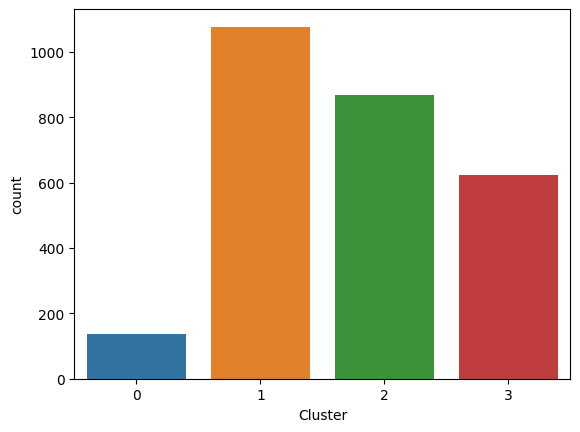

In [ ]:
sns.countplot(x="Cluster", data=cluster_df1)

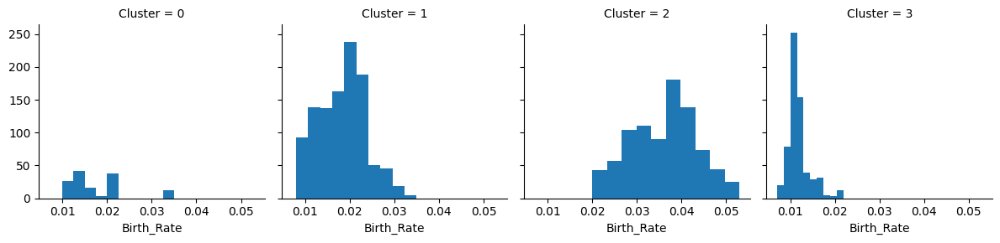

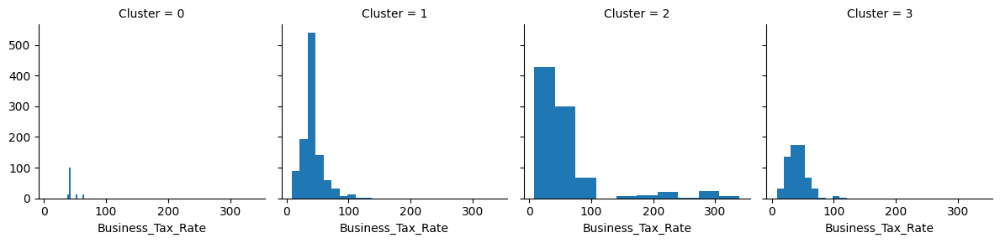

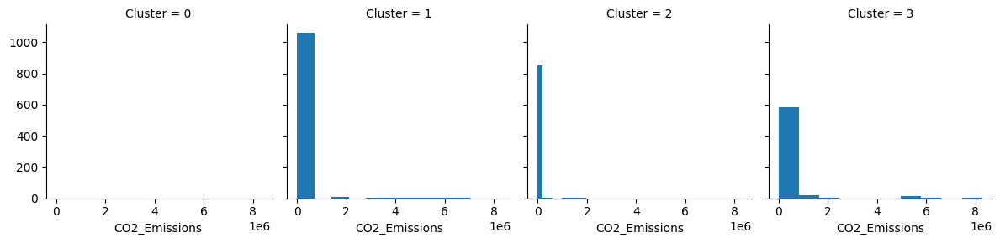

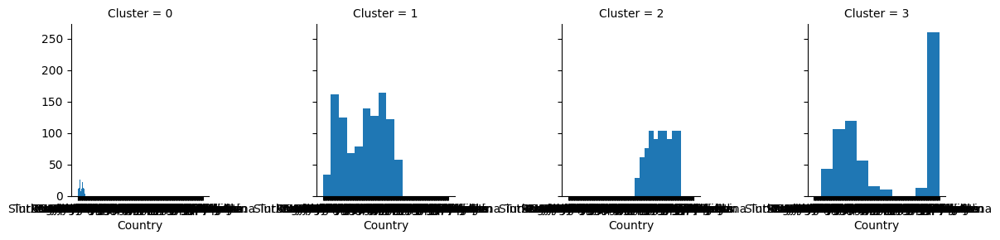

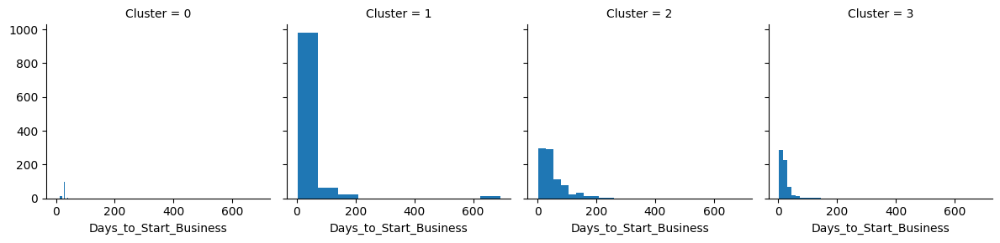

...

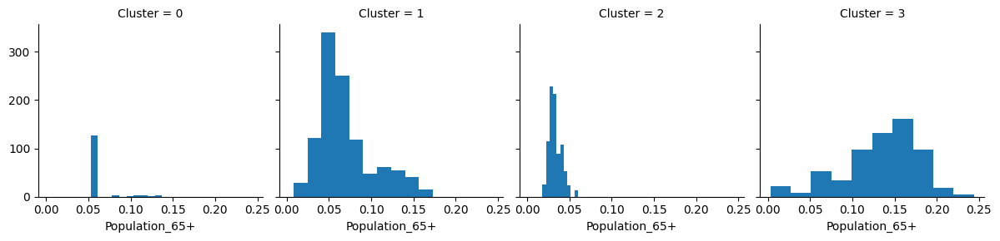

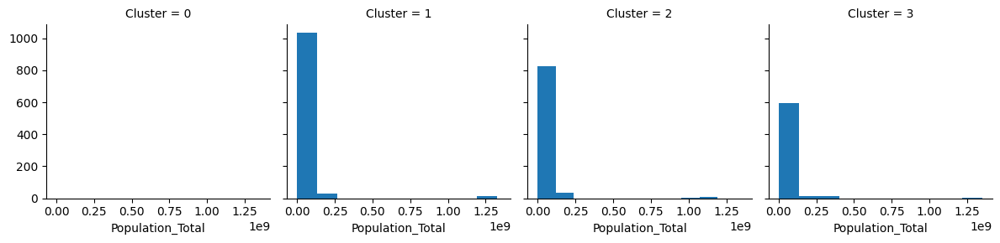

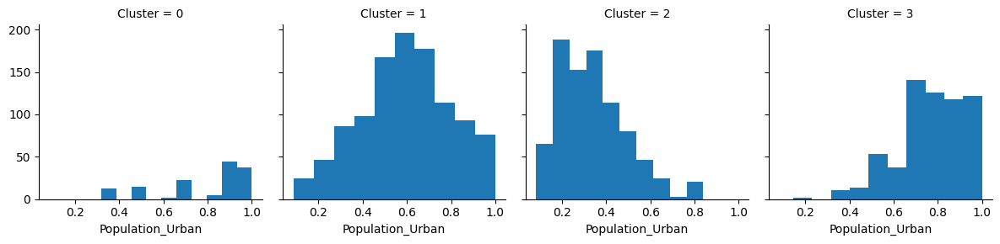

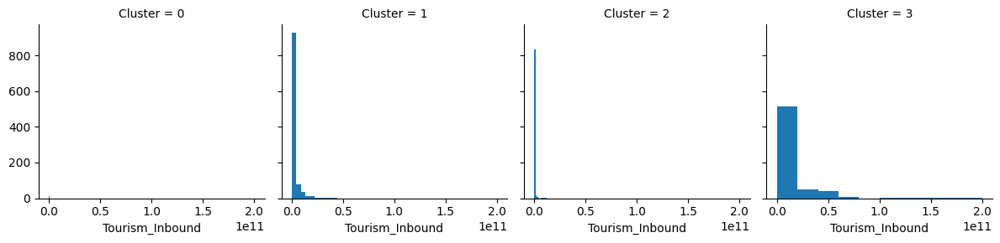

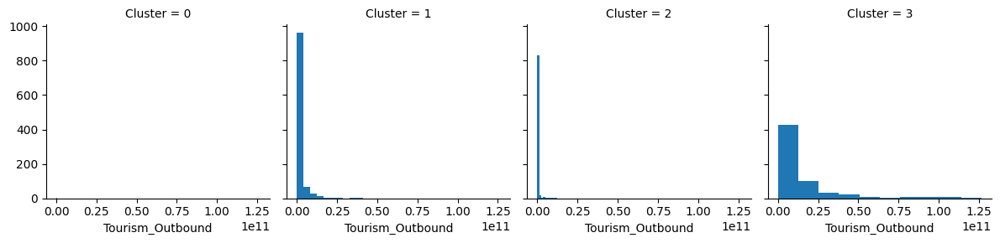

In [ ]:
for clstr in cluster_df1.drop(['Cluster'],axis=1):
    grid= sns.FacetGrid(cluster_df1, col='Cluster')
    grid= grid.map(plt.hist, clstr)
plt.show()

## **Saving the kmeans clustering model and the data with cluster label**

In [ ]:
#Saving Scikitlearn models
import joblib
joblib.dump(kmeans_model, "kmeans_model.pkl")

['kmeans_model.pkl']

In [ ]:
cluster_df1.to_csv("Clustered_ World_Development_Data.csv")

## **Training and Testing the model accuracy using Random Forest**

In [ ]:
#Split Dataset
X = cluster_df1.drop(['Cluster','Country'],axis=1)

y= cluster_df1['Cluster']
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.3, random_state=5)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import StandardScaler

from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report


from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

In [ ]:
clf = SVC()
param_grid = [{'kernel':['rbf'],'gamma':[50,5,10,0.5],'C':[15,14,13,12,11,10,0.1,0.001] }]
gsv = GridSearchCV(clf,param_grid,cv=10)
gsv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid=[{'C': [15, 14, 13, 12, 11, 10, 0.1, 0.001],
                          'gamma': [50, 5, 10, 0.5], 'kernel': ['rbf']}])

In [ ]:
clf=SVC()
clf.fit(X_train , y_train)
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred) * 100
print("Accuracy =", acc)
confusion_matrix(y_test, y_pred)

Accuracy = 45.44334975369458


array([[  0,  37,   0,   0],
       [  0, 281,   0,  32],
       [  0, 271,   0,   4],
       [  0,  99,   0,  88]])

In [ ]:
clf = SVC(kernel= "poly")
clf.fit(X_train , y_train)
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred) * 100
print("Accuracy =", acc)
confusion_matrix(y_test, y_pred)

Accuracy = 42.98029556650246


array([[  0,  37,   0,   0],
       [  0, 309,   0,   4],
       [  0, 275,   0,   0],
       [  0, 147,   0,  40]])

In [ ]:
gsv.best_params_ , gsv.best_score_

({'C': 15, 'gamma': 50, 'kernel': 'rbf'}, 0.4038095238095238)

In [ ]:
clf = SVC(C= 15, gamma = 50)
clf.fit(X_train , y_train)
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred) * 100
print("Accuracy =", acc)
confusion_matrix(y_test, y_pred)

Accuracy = 38.54679802955665


array([[  0,  37,   0,   0],
       [  0, 313,   0,   0],
       [  0, 275,   0,   0],
       [  0, 187,   0,   0]])

In [ ]:
#Confusion_Matrix
from sklearn.metrics import classification_report,confusion_matrix
import sklearn.metrics as metrics
print("Confusion Matrix")
print("____________________")
print(metrics.confusion_matrix(y_test, y_pred))
print("-----------------------------------------------------------------")
print("Classification Report")
print("______________________")
print(classification_report(y_test, y_pred))

Confusion Matrix
____________________
[[  0  37   0   0]
 [  0 313   0   0]
 [  0 275   0   0]
 [  0 187   0   0]]
-----------------------------------------------------------------
Classification Report
______________________
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       0.39      1.00      0.56       313
           2       0.00      0.00      0.00       275
           3       0.00      0.00      0.00       187

    accuracy                           0.39       812
   macro avg       0.10      0.25      0.14       812
weighted avg       0.15      0.39      0.21       812



In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(1892, 22)
(1892,)
(812, 22)
(812,)


In [ ]:
#Decision_Tree
from sklearn.ensemble import RandomForestClassifier
model3 = RandomForestClassifier(n_estimators=15, max_depth=25, random_state=11)
model3.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [ ]:
#Confusion_Matrix
from sklearn.metrics import classification_report,confusion_matrix
import sklearn.metrics as metrics
print("Confusion Matrix")
print("____________________")
print(metrics.confusion_matrix(y_test, data_pred))
print("-----------------------------------------------------------------")
print("Classification Report")
print("______________________")
print(classification_report(y_test, data_pred))